In [775]:
import pandas as pd # type:ignore
import numpy as np # type:ignore
import matplotlib.pyplot as plt # type:ignore
import seaborn as sns # type:ignore
from sklearn.datasets import make_blobs # type:ignore
from scipy.stats import multivariate_normal # type:ignore
from sklearn.metrics import confusion_matrix,classification_report # type:ignore
from scipy.optimize import linear_sum_assignment # type:ignore
from matplotlib.lines import Line2D # type:ignore
from sklearn.preprocessing import StandardScaler # type:ignore
from sklearn.decomposition import PCA # type:ignore
from sklearn.manifold import TSNE # type:ignore
import umap # type:ignore
from sklearn.cluster import KMeans,DBSCAN # type:ignore
from sklearn.mixture import GaussianMixture # type:ignore
from sklearn.neighbors import NearestNeighbors # type:ignore
import kmedoids # type:ignore
from pyclustering.cluster.kmedoids import kmedoids # type:ignore
from pyclustering.utils import distance_metric,type_metric # type:ignore
import warnings # type:ignore
warnings.filterwarnings("ignore",category=UserWarning) # type:ignore
from main import CorrelatedClusterGenerator

# data

In [776]:
np.random.seed(42)

In [777]:
cluster_generator = CorrelatedClusterGenerator(n_samples=10000,n_features=20,n_clusters=3,correlation=0.2,random_state=42)

In [778]:
X, y = cluster_generator.generate_clusters()

In [779]:
X = X + np.random.normal(scale=9,size=X.shape) 

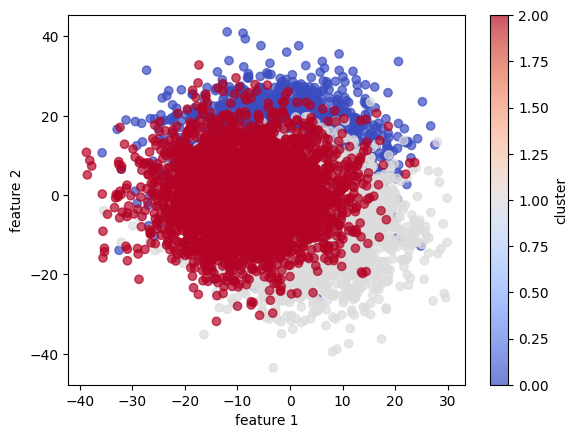

In [780]:
plt.scatter(X[:,0],X[:,1],c=y,cmap='coolwarm',alpha=0.7)
plt.xlabel("feature 1")
plt.ylabel("feature 2")
plt.colorbar(label="cluster")
plt.show()

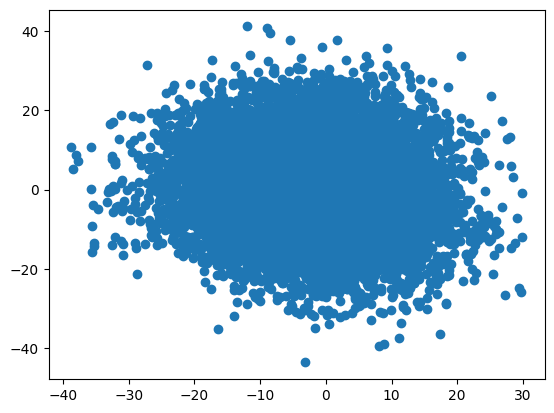

In [781]:
plt.scatter(X[:,0],X[:,1])
plt.show()

In [782]:
corr_dataset = pd.DataFrame(X) 

In [783]:
corr_dataset.columns = [f"vab_{col+1}" for col in corr_dataset.columns]

In [784]:
corr_dataset['target'] = y

In [785]:
corr_dataset

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,14.054115,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,0.478378,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,13.027205,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,6.055273,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,18.518867,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,9.458586,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-9.014112,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,24.382699,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,19.051329,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2


In [786]:
# sns.pairplot(corr_dataset)

## correlation matrix

In [787]:
corr_dataset.iloc[:,:-1].corr()

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,vab_11,vab_12,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20
vab_1,1.000000,-0.099807,0.089033,-0.185771,0.083685,0.036117,-0.042507,-0.004513,0.015514,-0.048159,-0.107509,-0.178549,-0.245239,0.001629,0.109242,-0.034841,0.089635,-0.025158,0.214134,0.040488
vab_2,-0.099807,1.000000,0.202393,0.095561,-0.156632,-0.293060,-0.084423,0.178552,0.007357,0.312110,-0.255416,0.348549,0.294652,-0.325427,-0.351321,-0.282103,0.016780,0.230981,-0.098385,-0.067505
vab_3,0.089033,0.202393,1.000000,-0.112815,-0.058396,-0.231951,-0.124893,0.172440,0.018012,0.239671,-0.354352,0.113142,0.013036,-0.276178,-0.205077,-0.304699,0.108461,0.153710,0.126119,-0.015157
vab_4,-0.185771,0.095561,-0.112815,1.000000,-0.068991,-0.028394,0.052482,0.000490,-0.011409,0.031676,0.136499,0.179264,0.262527,0.019861,-0.089303,0.063472,-0.078567,0.031586,-0.221677,-0.039319
vab_5,0.083685,-0.156632,-0.058396,-0.068991,1.000000,0.137354,0.017486,-0.054635,0.000056,-0.119891,0.075719,-0.153555,-0.151145,0.125725,0.135319,0.101491,-0.002052,-0.099497,0.081738,0.024670
vab_6,0.036117,-0.293060,-0.231951,-0.028394,0.137354,1.000000,0.089738,-0.164698,-0.004147,-0.262305,0.291712,-0.246695,-0.191405,0.305222,0.272132,0.287851,-0.034166,-0.194177,0.019355,0.062750
vab_7,-0.042507,-0.084423,-0.124893,0.052482,0.017486,0.089738,1.000000,-0.083045,-0.011551,-0.082777,0.156592,-0.044820,0.001008,0.112632,0.090851,0.128853,-0.048697,-0.085996,-0.056879,0.040162
vab_8,-0.004513,0.178552,0.172440,0.000490,-0.054635,-0.164698,-0.083045,1.000000,-0.006720,0.175228,-0.201722,0.132011,0.088006,-0.196887,-0.168614,-0.190074,0.043450,0.125827,0.014651,-0.019254
vab_9,0.015514,0.007357,0.018012,-0.011409,0.000056,-0.004147,-0.011551,-0.006720,1.000000,0.002110,-0.012646,0.000279,-0.017638,-0.006110,-0.001349,-0.005232,0.006983,0.007431,0.015671,0.006465
vab_10,-0.048159,0.312110,0.239671,0.031676,-0.119891,-0.262305,-0.082777,0.175228,0.002110,1.000000,-0.298475,0.267484,0.200325,-0.301618,-0.315777,-0.288369,0.048123,0.200573,-0.033379,-0.050096


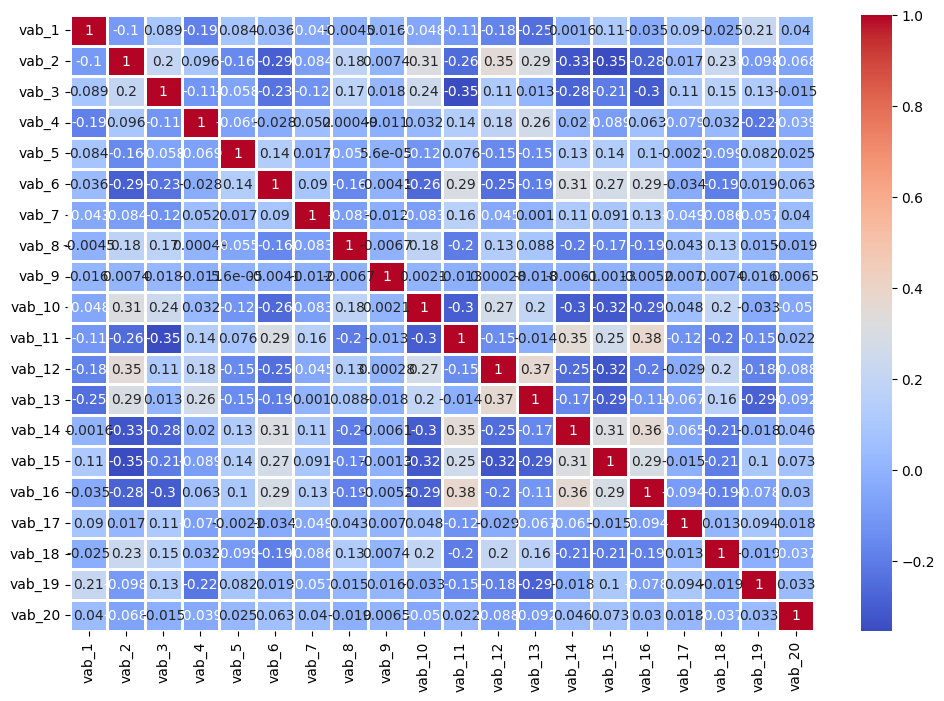

In [788]:
plt.figure(figsize=(12,8))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='coolwarm',annot=True,linewidths=1)
plt.show()

## data standardization

In [789]:
X_values = corr_dataset.iloc[:,:-1].values

In [790]:
y_values = corr_dataset.iloc[:,-1].values

In [791]:
scaler = StandardScaler()

In [792]:
X_values = scaler.fit_transform(X_values)

In [793]:
np.mean(X_values),np.std(X_values)

(-1.7573479203267604e-16, 1.0000000000000002)

In [794]:
pd.DataFrame(X_values)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.523102,0.741614,1.857675,0.526483,0.934004,-0.589320,-0.337144,-0.439146,-0.258103,1.064839,-1.845647,0.991193,-0.188094,-0.145822,-1.261950,-1.868313,0.550943,0.533458,0.820291,-1.315601
1,1.253041,0.550301,-0.495718,-1.366063,-0.719246,-2.123910,0.236615,0.648649,-0.053450,-0.030207,-1.521207,-0.210594,0.434952,-0.718307,-1.034744,-1.956807,0.698164,0.186842,0.178981,0.219924
2,0.048795,0.459712,1.220366,0.420590,-0.193923,-0.855992,0.413641,-0.181767,0.515440,1.071027,-0.241625,0.900286,-0.010452,0.069625,0.043062,-1.792565,0.544567,0.787360,1.023212,0.988137
3,0.123142,0.048786,0.366634,0.423499,-0.247612,-0.205149,0.832851,0.828025,-0.169459,0.261361,-2.816851,0.283098,0.451767,-1.498036,-0.014608,-1.359872,0.250976,0.107983,1.683825,1.311218
4,0.691152,0.730856,1.233532,-0.053247,0.639096,-0.138477,0.376297,0.881297,0.445535,1.444908,0.886481,1.386433,-0.615769,-0.881375,-1.156817,-0.856597,-0.001816,0.418142,0.508968,-0.154015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,0.442495,-0.720141,-0.174027,0.738465,1.151702,1.569514,-0.179011,-0.868154,2.712112,-1.634092,0.091748,0.584375,0.243639,0.524948,0.011946,0.978226,2.599925,-0.494733,-0.070464,-0.377152
9995,-0.723870,-0.585242,-0.724403,0.533483,-0.130458,0.287888,2.159290,-1.383976,-0.867706,-0.724855,0.406097,-1.050914,-0.469903,1.622693,0.526707,-0.833223,1.511678,-1.465592,-0.355298,0.539636
9996,-2.642139,-1.365035,-0.287650,-1.326599,0.132789,-0.030696,0.145505,-0.432851,0.070590,-0.025681,-0.998842,1.905527,0.466921,0.875100,-0.996709,-0.793943,0.848213,1.281550,-1.736764,0.018171
9997,-0.403170,0.560970,0.122957,-0.035472,0.206068,0.306479,-0.029756,-1.569627,1.202904,-0.911085,0.403201,1.433569,1.334253,1.871846,-0.699893,-0.585235,-1.685514,-0.407709,-2.287709,0.718642


<Axes: ylabel='Density'>

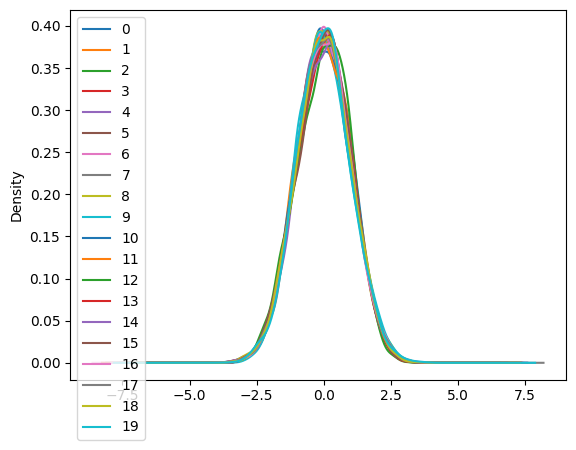

In [795]:
pd.DataFrame(X_values).plot(kind='density')

## pca 

In [796]:
pca_general = PCA()

In [797]:
pca_general.fit(X_values)

PCA()

In [798]:
explained_variance = pca_general.explained_variance_ratio_

In [799]:
explained_variance

array([0.18917157, 0.10682954, 0.05032615, 0.05006303, 0.04744267,
       0.04661774, 0.04614771, 0.04371266, 0.04275724, 0.04043589,
       0.03876382, 0.0371056 , 0.03620199, 0.03496012, 0.03433445,
       0.03271748, 0.03185633, 0.03131563, 0.03037   , 0.02887038])

In [800]:
eigenvalues = pca_general.explained_variance_

In [801]:
pd.DataFrame(eigenvalues)

,0
0,3.783810
1,2.136805
2,1.006624
3,1.001361
4,0.948948
5,0.932448
6,0.923046
7,0.874341
8,0.855230
9,0.808799


In [802]:
eigenvectors = pca_general.components_

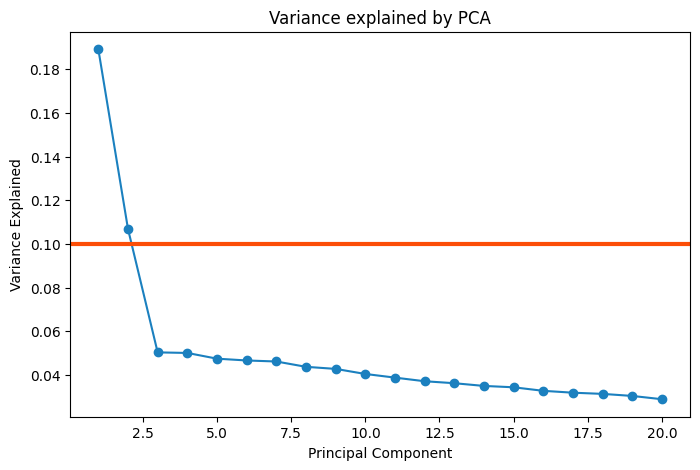

In [803]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [804]:
pca = PCA(n_components=4)

In [805]:
principal_components = pca.fit_transform(X_values)

In [806]:
pd.DataFrame(principal_components).head(8)

,0,1,2,3
0,3.055062,1.177602,-1.191926,-0.069577
1,2.432570,1.734501,0.600928,-0.323099
2,1.919437,0.914030,1.352838,0.266754
3,2.137032,1.774070,1.601006,-0.686147
4,2.016786,0.653948,0.142241,0.310362
5,0.989629,0.453456,2.216205,-1.262445
6,1.671377,0.122973,0.117637,-0.618386
7,0.805212,-0.596762,0.883936,-1.347664


In [807]:
principal_df = pd.DataFrame(data = principal_components,columns = ['principal component 1','principal component 2','principal component 3','principal component 4'])

In [808]:
final_df = pd.concat([principal_df,corr_dataset[['target']]],axis = 1)

In [809]:
final_df

,principal component 1,principal component 2,principal component 3,principal component 4,target
0,3.055062,1.177602,-1.191926,-0.069577,0
1,2.432570,1.734501,0.600928,-0.323099,0
2,1.919437,0.914030,1.352838,0.266754,0
3,2.137032,1.774070,1.601006,-0.686147,0
4,2.016786,0.653948,0.142241,0.310362,0
...,...,...,...,...,...
9994,-1.781095,-0.018699,0.145970,2.708121,2
9995,-2.347886,-0.541839,1.438488,-1.279093,2
9996,1.085237,-1.384588,0.230630,0.049670,2
9997,-0.182467,-2.639584,0.539806,1.398937,2


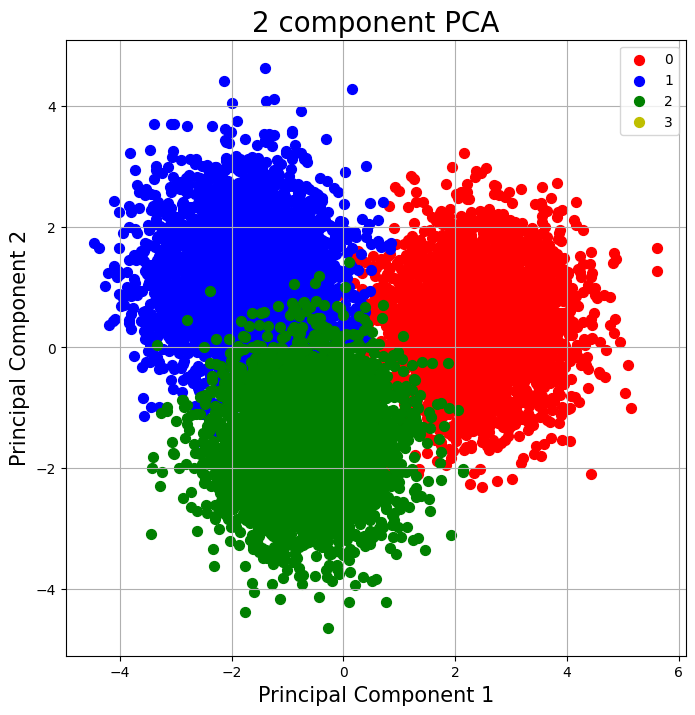

In [810]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

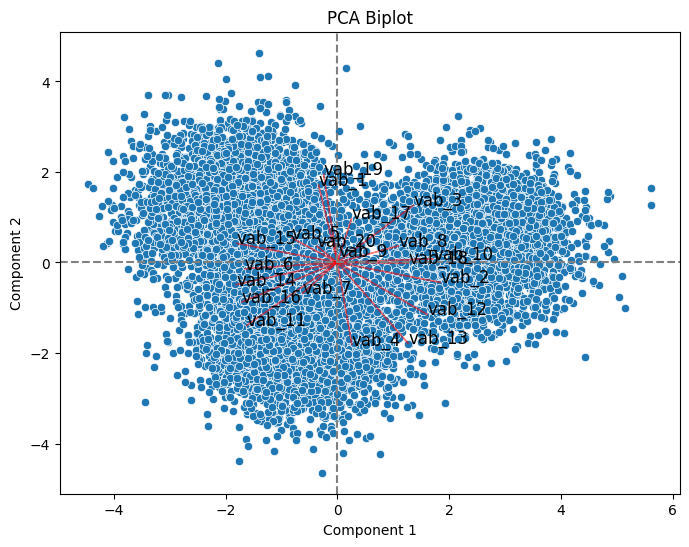

In [811]:
scores = pca.transform(X_values)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=scores[:, 0], y=scores[:, 1])
for i, col in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.arrow(0, 0, eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), color='r', alpha=0.5)
    plt.text(eigenvectors[0, i] * max(scores[:, 0]), eigenvectors[1, i] * max(scores[:, 1]), col, fontsize=12)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('PCA Biplot')
plt.axhline(0, color='gray', linestyle='--')
plt.axvline(0, color='gray', linestyle='--')
plt.show()

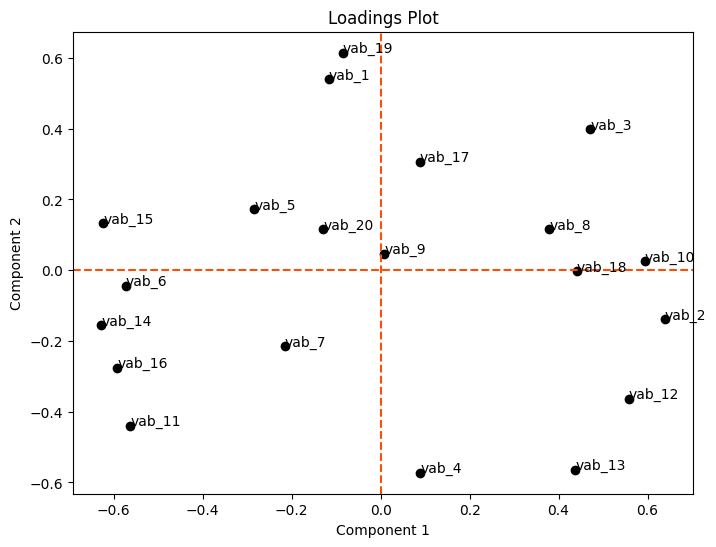

In [812]:
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)
plt.figure(figsize=(8, 6))
plt.scatter(loadings[:, 0], loadings[:, 1], color='black')
for i, txt in enumerate(corr_dataset.iloc[:,:-1].columns):
    plt.text(loadings[i, 0], loadings[i, 1], txt, fontsize=10)
plt.axhline(0, color='#FC4E07', linestyle='--')
plt.axvline(0, color='#FC4E07', linestyle='--')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Loadings Plot')
plt.show()

In [813]:
X_pca = pca.transform(X_values)

In [814]:
pd.DataFrame(X_pca).head()

,0,1,2,3
0,3.055062,1.177602,-1.191926,-0.069577
1,2.432570,1.734501,0.600928,-0.323099
2,1.919437,0.914030,1.352838,0.266754
3,2.137032,1.774070,1.601006,-0.686147
4,2.016786,0.653948,0.142241,0.310362


## t-SNE

In [815]:
tsne = TSNE(n_components=3,random_state=42)

In [816]:
X_tsne = tsne.fit_transform(X_values)

In [817]:
tsne_data = pd.concat([pd.DataFrame(X_tsne,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [818]:
tsne_data

,dim_1,dim_2,dim_3,target
0,24.363562,-3.687086,26.388060,0
1,37.817570,-15.151444,-2.483228,0
2,18.046495,0.077204,11.019123,0
3,32.009579,34.284218,-2.199601,0
4,38.566338,4.744205,0.358651,0
...,...,...,...,...
9994,-36.352070,33.754440,9.793451,2
9995,-23.397438,10.752803,37.727283,2
9996,13.650776,-7.933866,15.096188,2
9997,-3.079395,1.549959,-21.995962,2


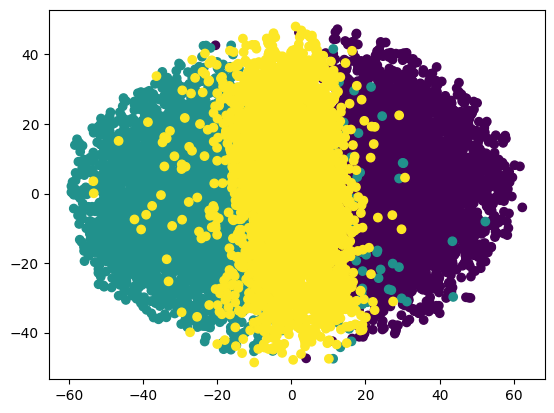

In [819]:
plt.scatter(x=tsne_data['dim_1'],y=tsne_data['dim_2'],c=tsne_data['target'])
plt.show()

In [820]:
tsne.kl_divergence_

3.499032497406006

## umap

In [821]:
umap = umap.UMAP(n_components=3,random_state=42)

In [822]:
X_umap = umap.fit_transform(X_values)

In [823]:
umap_data = pd.concat([pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3')),corr_dataset['target']],axis=1)

In [824]:
umap_data

,dim_1,dim_2,dim_3,target
0,9.514001,6.487527,4.528633,0
1,9.453291,5.358151,4.249003,0
2,9.225744,5.237971,3.670132,0
3,8.572925,5.113635,4.498827,0
4,9.068519,6.257785,3.941083,0
...,...,...,...,...
9994,4.311389,1.146553,5.921623,2
9995,3.974805,2.244182,5.072158,2
9996,5.555993,4.484549,6.102122,2
9997,3.488679,4.576699,5.907626,2


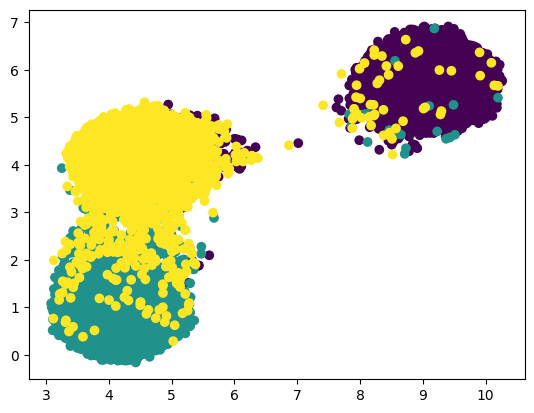

In [825]:
plt.scatter(umap_data['dim_1'],umap_data['dim_2'],c=umap_data['target'])
plt.show()

## k-means 

In [826]:
kmeans = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [827]:
kmeans.fit(X_values)

KMeans(n_clusters=3, random_state=42)

In [828]:
df_kmeans = corr_dataset.copy()

In [829]:
df_kmeans['k_means'] = kmeans.labels_

In [830]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [831]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.019001900190019003
accuracy after: 0.963996399639964


In [832]:
df_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,k_means
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


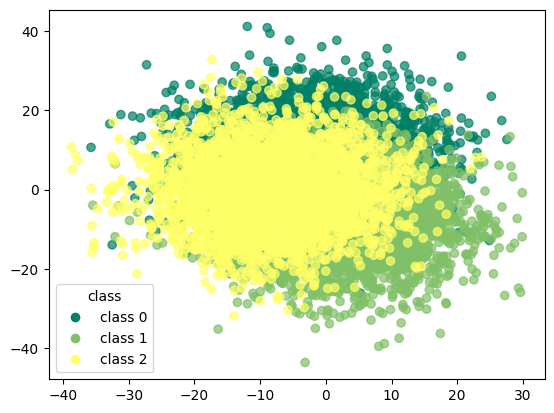

In [833]:
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

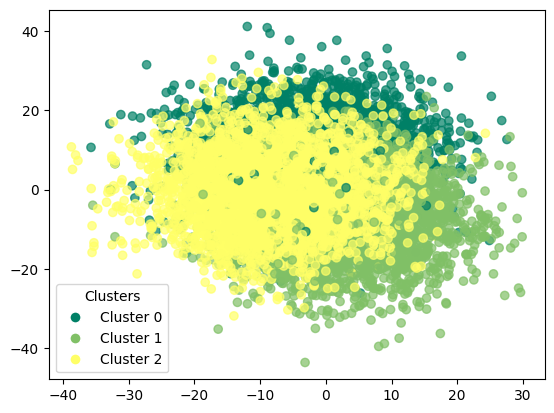

In [834]:
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [835]:
kmeans.cluster_centers_

array([[ 0.52835157, -0.69007652, -0.10424731, -0.53861571,  0.35634405,
         0.4774698 ,  0.02893472, -0.22627863,  0.03867069, -0.51222404,
         0.12579399, -0.82668014, -0.92433316,  0.43670877,  0.68707715,
         0.30515605,  0.1551098 , -0.38226906,  0.59110799,  0.19598446],
       [-0.54280886, -0.06127592, -0.59786028,  0.58188152, -0.0762517 ,
         0.244177  ,  0.27438533, -0.2540904 , -0.05830628, -0.2354632 ,
         0.73827079,  0.23718876,  0.55134383,  0.40197919,  0.04610878,
         0.52201266, -0.32787602, -0.14211944, -0.65924837, -0.07694178],
       [ 0.01574497,  0.74278532,  0.69555173, -0.04432349, -0.27663292,
        -0.71391539, -0.30053101,  0.47546809,  0.01956376,  0.73962984,
        -0.85600338,  0.58200483,  0.36717625, -0.8300196 , -0.72478924,
        -0.81895612,  0.17163779,  0.51867572,  0.06911647, -0.11745294]])

In [836]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3281   12   40]
 [  19 3193  121]
 [  57  111 3165]]


In [837]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.96      0.96      0.96      3333
           2       0.95      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



### k-means with pca

In [838]:
kmeans_pca = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [839]:
kmeans_pca.fit(X_pca)

KMeans(n_clusters=3, random_state=42)

In [840]:
df_pca_kmeans = corr_dataset.copy()

In [841]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [842]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [843]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.019001900190019003
accuracy after: 0.9634963496349634


In [844]:
df_pca_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


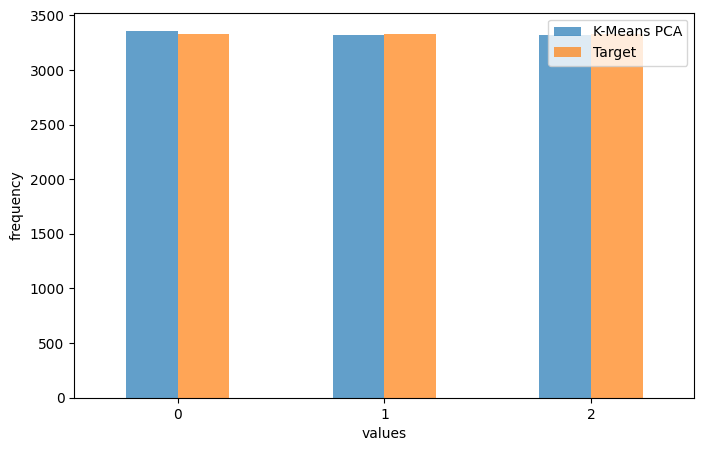

In [845]:
counts_kmeans = df_pca_kmeans['kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [846]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[3280   13   40]
 [  20 3193  120]
 [  57  115 3161]]


In [847]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.96      0.96      0.96      3333
           2       0.95      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



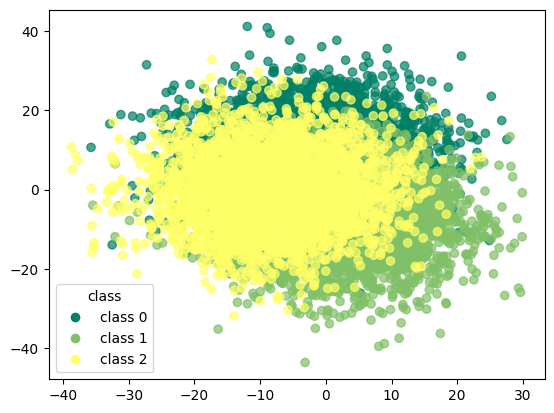

In [848]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

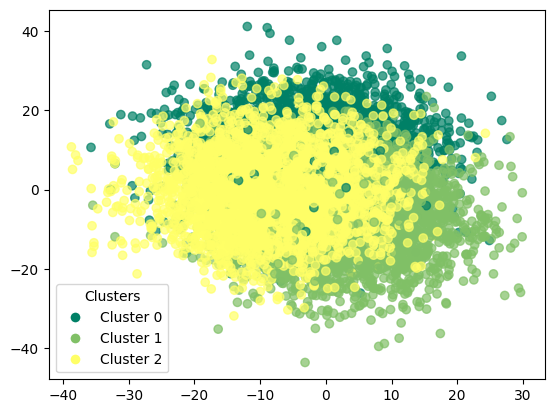

In [849]:
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

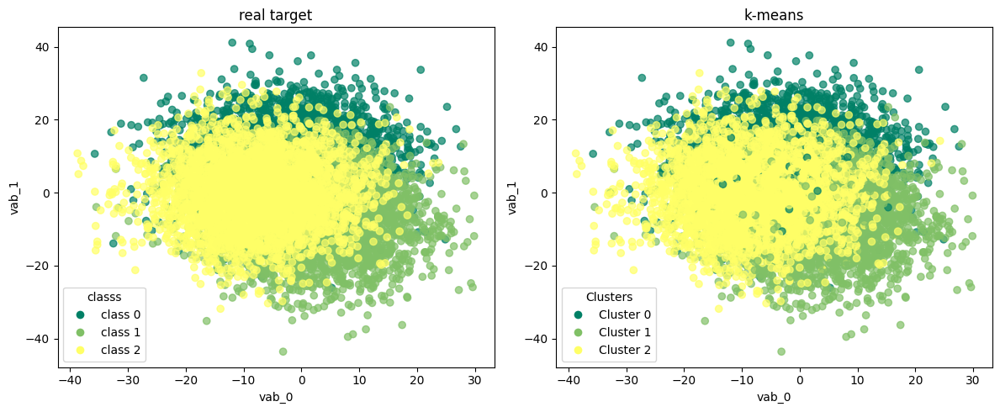

In [850]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

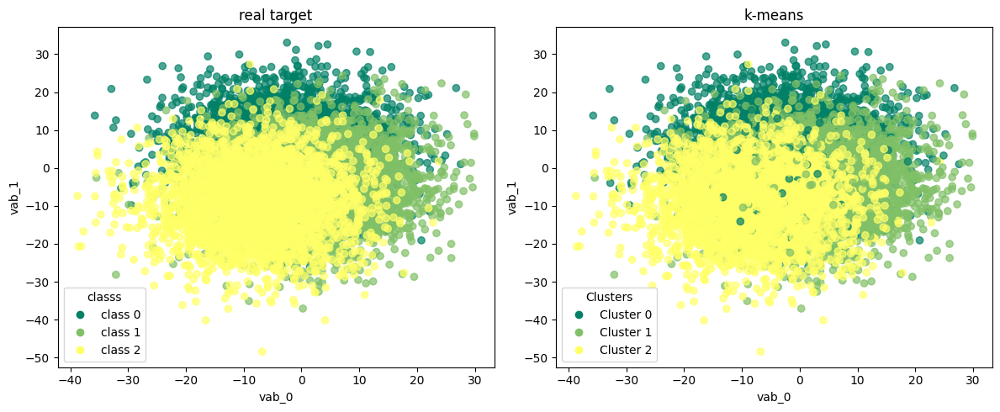

In [851]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 2], 
                           c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

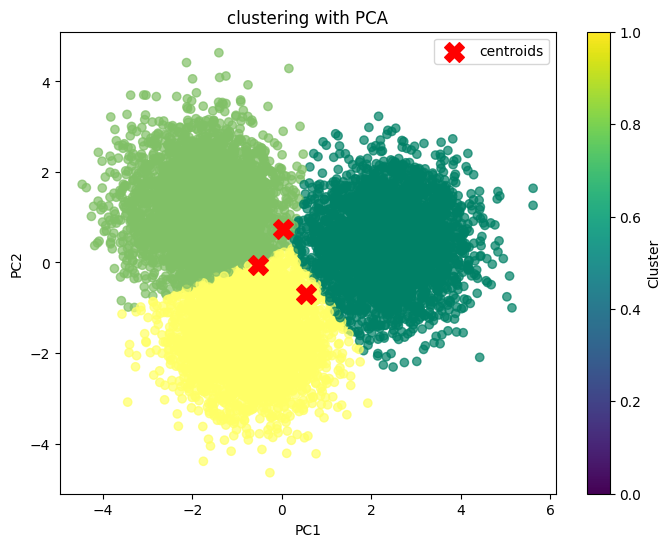

In [852]:
plt.figure(figsize=(8, 6))
plt.scatter(final_df['principal component 1'], final_df['principal component 2'] , c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            c='red', marker='X', s=200, label='centroids')

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('clustering with PCA')
plt.colorbar(label='Cluster')
plt.legend()
plt.show()

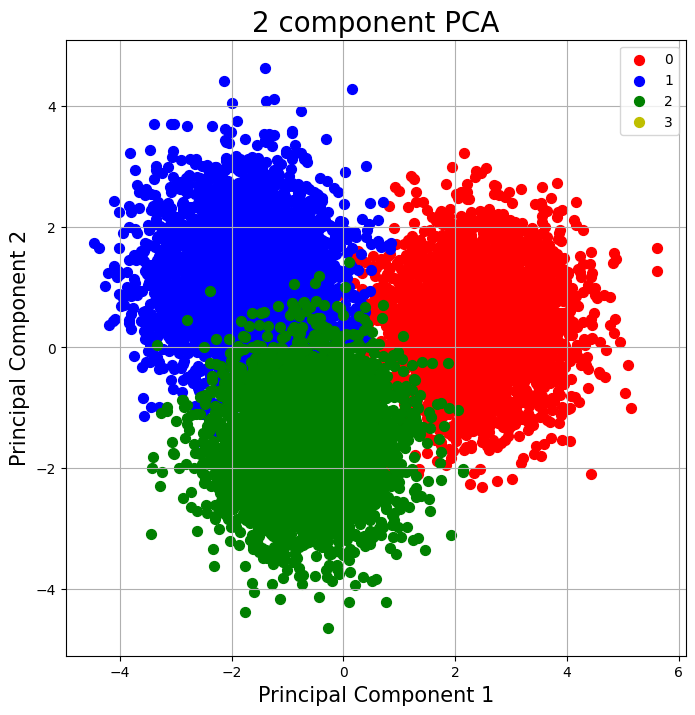

In [853]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1',fontsize = 15)
ax.set_ylabel('Principal Component 2',fontsize = 15)
ax.set_title('2 component PCA',fontsize = 20)

targets = [0,1,2,3]
colors = ['r','b','g','y']
for target, color in zip(targets,colors):
    indicesToKeep = final_df['target'] == target
    ax.scatter(final_df.loc[indicesToKeep, 'principal component 1']
               ,final_df.loc[indicesToKeep, 'principal component 2']
               ,c = color
               ,s = 50)
ax.legend(targets)
ax.grid()

### k-means with t-SNE

In [854]:
kmeans_tsne = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [855]:
kmeans_tsne.fit(X_tsne)

KMeans(n_clusters=3, random_state=42)

In [856]:
df_tsne_kmeans = corr_dataset.copy()

In [857]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [858]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [859]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.12371237123712371
accuracy after: 0.7504750475047505


In [860]:
df_tsne_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


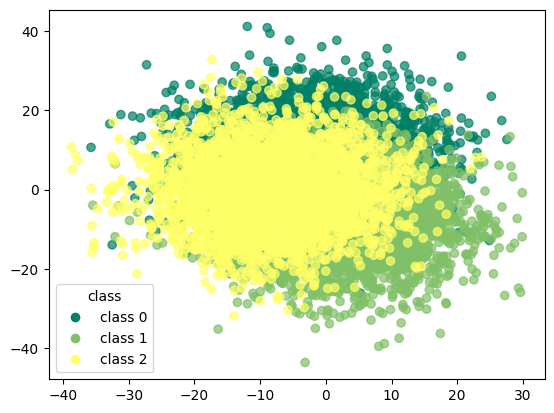

In [861]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

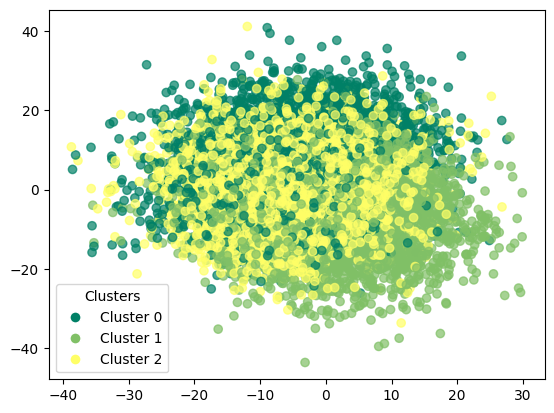

In [862]:
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

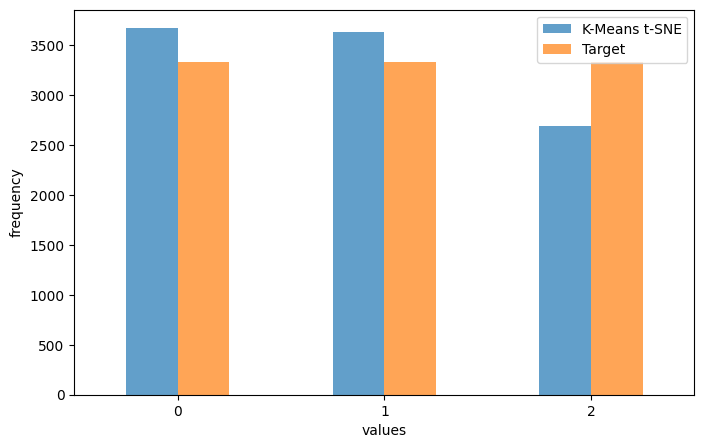

In [863]:
counts_kmeans = df_tsne_kmeans['kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [864]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[2916    5  412]
 [  25 2807  501]
 [ 731  821 1781]]


In [865]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.79      0.87      0.83      3333
           1       0.77      0.84      0.81      3333
           2       0.66      0.53      0.59      3333

    accuracy                           0.75      9999
   macro avg       0.74      0.75      0.74      9999
weighted avg       0.74      0.75      0.74      9999



### k-means with umap

In [866]:
kmeans_umap = KMeans(n_clusters=3,init='k-means++',random_state=42)

In [867]:
kmeans_umap.fit(X_umap)

KMeans(n_clusters=3, random_state=42)

In [868]:
df_umap_kmeans = corr_dataset.copy()

In [869]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [870]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,1
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,2
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,0


In [871]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.024702470247024703
accuracy after: 0.9550955095509551


In [872]:
df_umap_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,kmeans_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


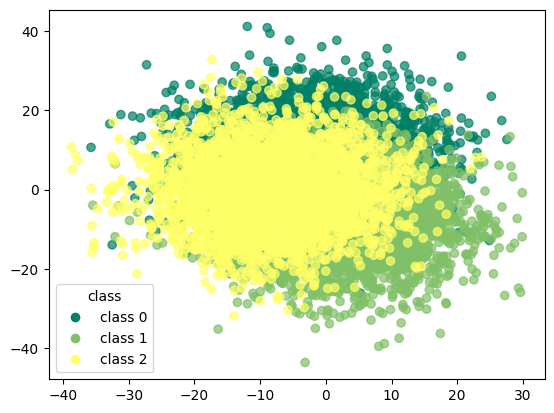

In [873]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

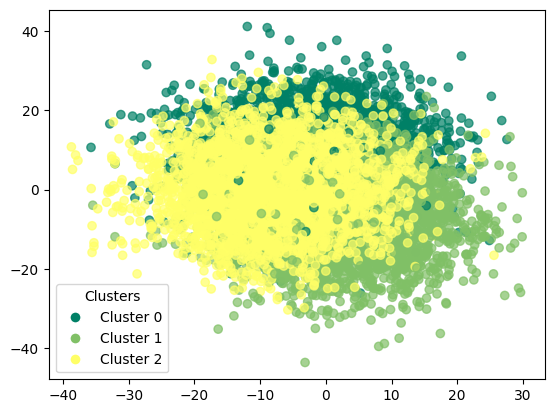

In [874]:
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

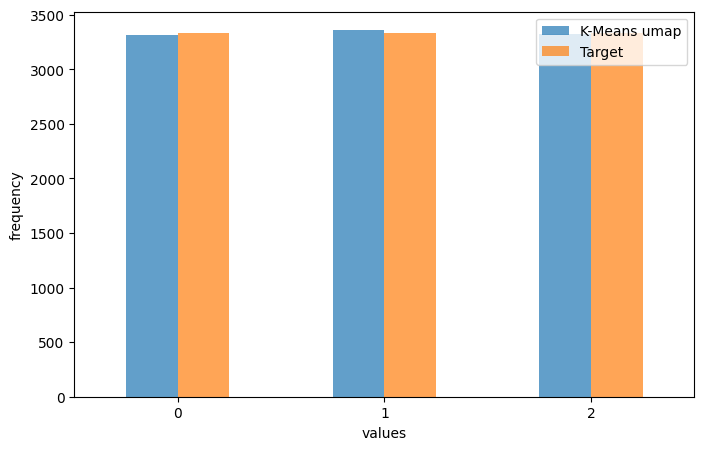

In [875]:
counts_kmeans = df_umap_kmeans['kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [876]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[3245   19   69]
 [  19 3181  133]
 [  50  159 3124]]


In [877]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.95      0.95      0.95      3333
           2       0.94      0.94      0.94      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



## trimmed k-means

In [878]:
def trimmed_clustering(X,n_clusters,trim_fraction=0.1):

    kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(X)
    distances = np.min(kmeans.transform(X),axis=1)
    
    trim_threshold = np.percentile(distances,100 * (1 - trim_fraction))
    trimmed_X = X[distances < trim_threshold]
    trimmed_indices = np.where(distances < trim_threshold)[0]
    trimmed_kmeans = KMeans(n_clusters=n_clusters,random_state=42).fit(trimmed_X)
    
    return trimmed_kmeans,trimmed_indices

In [879]:
trimmed_kmeans,trimmmed_indces = trimmed_clustering(X_values,n_clusters=3,trim_fraction=0.1)

In [880]:
trimmed_kmeans

KMeans(n_clusters=3, random_state=42)

In [881]:
df_trim_kmeans = corr_dataset.copy()

In [882]:
df_trim_kmeans = df_trim_kmeans.iloc[trimmmed_indces]  

In [883]:
df_trim_kmeans['trim_kmeans'] = trimmed_kmeans.labels_

In [884]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,1
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [885]:
y_true = df_trim_kmeans['target'].values  
y_kmeans = df_trim_kmeans['trim_kmeans'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_trim_kmeans['trim_kmeans'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_trim_kmeans['trim_kmeans'] == y_true))

accuracy before: 0.01777975330592288
accuracy after: 0.9659962218024225


In [886]:
df_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,2
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,2
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


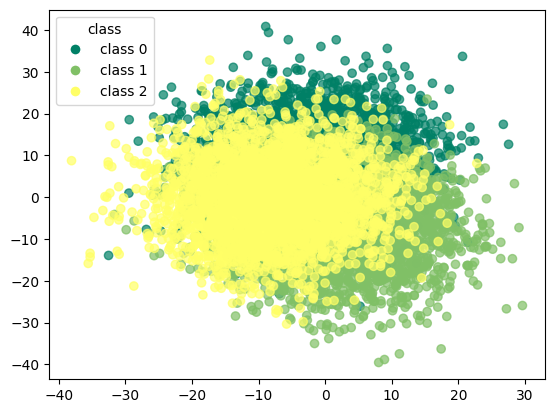

In [887]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

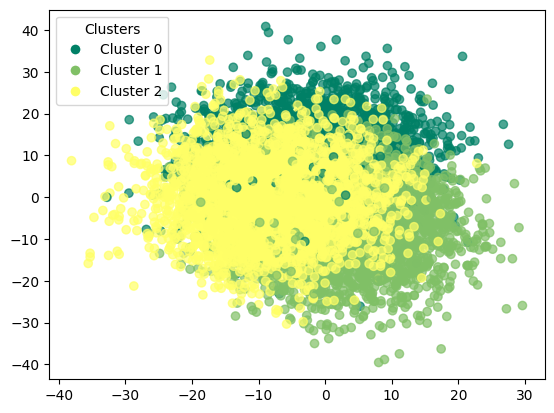

In [888]:
scatter = plt.scatter(df_trim_kmeans.iloc[:, 0], df_trim_kmeans.iloc[:, 1], 
                      c=df_trim_kmeans['trim_kmeans'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_trim_kmeans['trim_kmeans'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [889]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[2958    8   33]
 [  16 2844  107]
 [  45   97 2891]]


In [890]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2999
           1       0.96      0.96      0.96      2967
           2       0.95      0.95      0.95      3033

    accuracy                           0.97      8999
   macro avg       0.97      0.97      0.97      8999
weighted avg       0.97      0.97      0.97      8999



### trimmed k-means with pca

In [891]:
trim_kmeans_pca,trimmmed_indices = trimmed_clustering(X_pca,n_clusters=3,trim_fraction=0.1)

In [892]:
trim_kmeans_pca

KMeans(n_clusters=3, random_state=42)

In [893]:
df_pca_trim_kmeans = corr_dataset.copy()

In [894]:
df_pca_trim_kmeans = df_pca_trim_kmeans.iloc[trimmmed_indces]  

In [895]:
df_pca_trim_kmeans["trim_kmeans_pca"] = trim_kmeans_pca.labels_

In [896]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,1
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [897]:
y_true = df_pca_trim_kmeans['target'].values  
y_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_trim_kmeans['trim_kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_trim_kmeans['trim_kmeans_pca'] == y_true))

accuracy before: 0.017557506389598843
accuracy after: 0.9603289254361596


In [898]:
df_pca_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,2
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,2
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


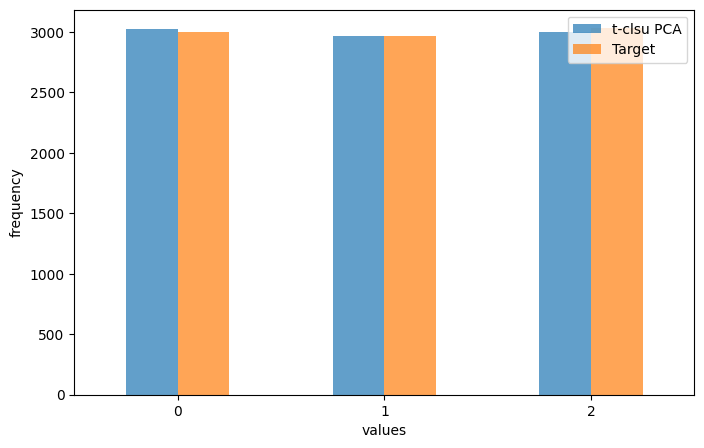

In [899]:
counts_kmeans = df_pca_trim_kmeans['trim_kmeans_pca'].value_counts().sort_index()
counts_target = df_pca_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'t-clust PCA': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["t-clsu PCA", "Target"])
plt.xticks(rotation=0)  
plt.show()


In [900]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[2951   12   36]
 [  34 2829  104]
 [  42  129 2862]]


In [901]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2999
           1       0.95      0.95      0.95      2967
           2       0.95      0.94      0.95      3033

    accuracy                           0.96      8999
   macro avg       0.96      0.96      0.96      8999
weighted avg       0.96      0.96      0.96      8999



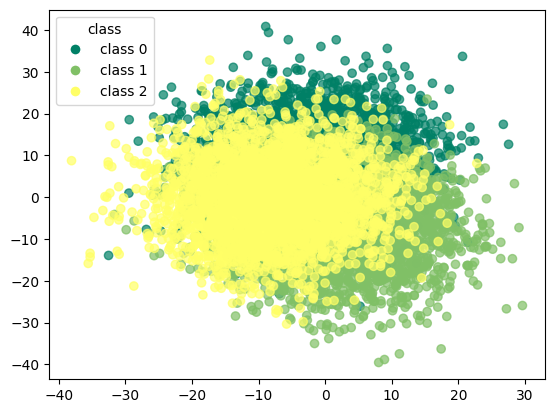

In [902]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

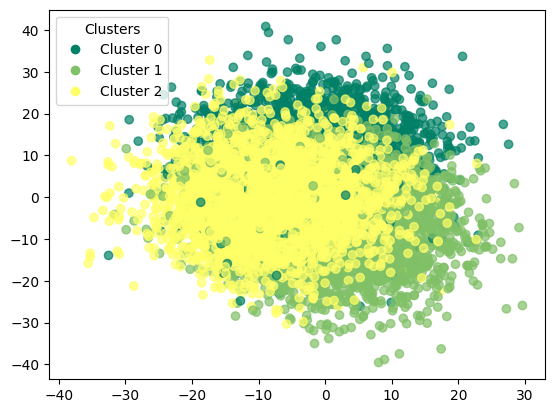

In [903]:
scatter = plt.scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                      c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

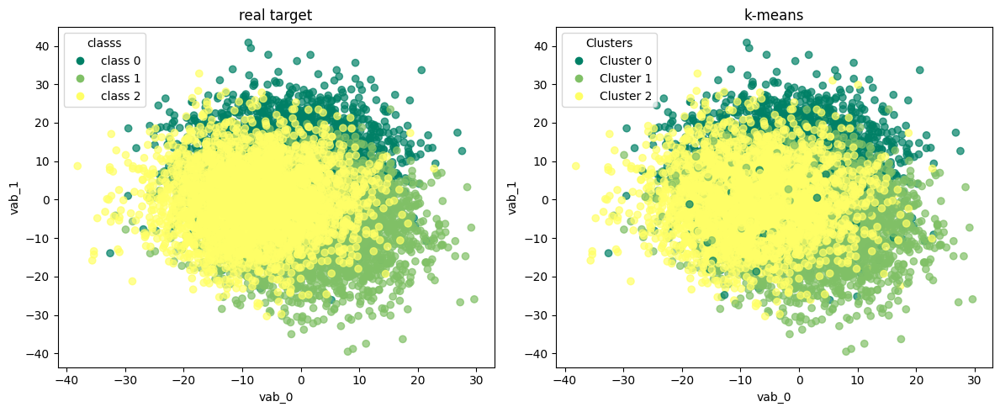

In [904]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 1], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

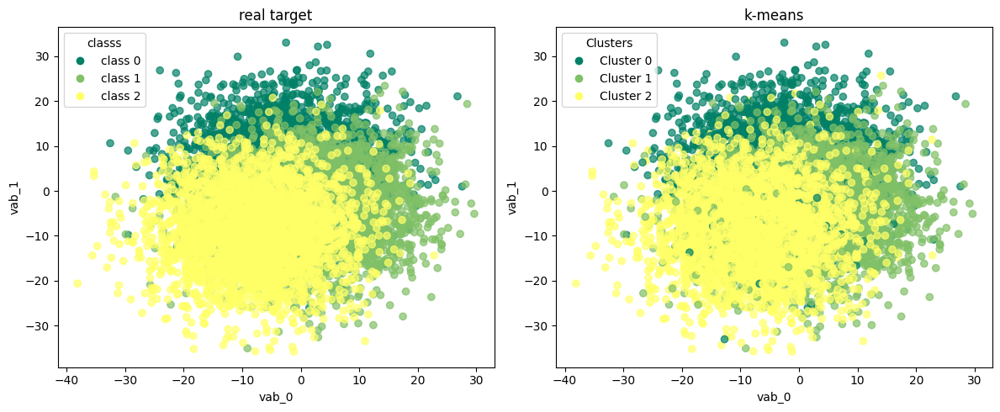

In [905]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  

scatter1 = axes[0].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_trim_kmeans['target'])
legend_elements1 = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                           markerfacecolor=scatter1.cmap(scatter1.norm(label)), markersize=8) 
                    for label in unique_labels]
axes[0].legend(handles=legend_elements1, title="classs")
axes[0].set_title("real target")

scatter2 = axes[1].scatter(df_pca_trim_kmeans.iloc[:, 0], df_pca_trim_kmeans.iloc[:, 2], 
                           c=df_pca_trim_kmeans['trim_kmeans_pca'], cmap='summer', alpha=0.7)

unique_clusters = np.unique(df_pca_trim_kmeans['trim_kmeans_pca'])
legend_elements2 = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                           markerfacecolor=scatter2.cmap(scatter2.norm(cluster)), markersize=8) 
                    for cluster in unique_clusters]
axes[1].legend(handles=legend_elements2, title="Clusters")
axes[1].set_title("k-means")

for ax in axes:
    ax.set_xlabel("vab_0")
    ax.set_ylabel("vab_1")

plt.tight_layout()  
plt.show()

### trimmed k-means with t-SNE

In [906]:
trim_kmeans_tsne,trimmmed_indices = trimmed_clustering(X_tsne,n_clusters=3,trim_fraction=0.1)

In [907]:
trim_kmeans_tsne

KMeans(n_clusters=3, random_state=42)

In [908]:
df_tsne_trim_kmeans = corr_dataset.copy()

In [909]:
df_tsne_trim_kmeans = df_tsne_trim_kmeans.iloc[trimmmed_indces]  

In [910]:
df_tsne_trim_kmeans['trim_kmeans_tsne'] = trim_kmeans_tsne.labels_

In [911]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,1
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,0


In [912]:
y_true = df_tsne_trim_kmeans['target'].values  
y_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_trim_kmeans['trim_kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_trim_kmeans['trim_kmeans_tsne'] == y_true))

accuracy before: 0.37237470830092234
accuracy after: 0.7566396266251806


In [913]:
df_tsne_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9992,-3.763790,-3.662760,-22.027848,-4.865125,-19.694773,14.620318,-0.500696,4.525619,9.151222,-5.239664,...,3.523859,9.771715,3.127192,21.251260,-10.228659,-3.519013,-5.088418,-7.507345,2,1
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


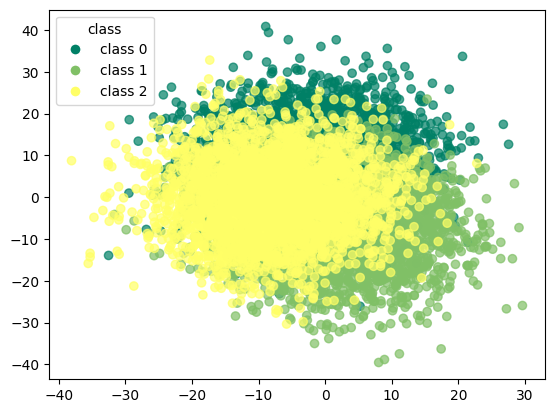

In [914]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

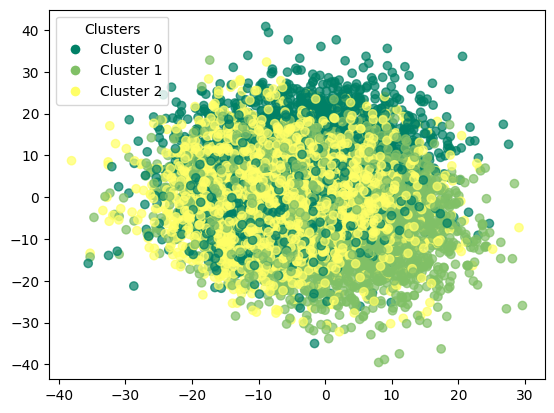

In [915]:
scatter = plt.scatter(df_tsne_trim_kmeans.iloc[:, 0], df_tsne_trim_kmeans.iloc[:, 1], 
                      c=df_tsne_trim_kmeans['trim_kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_trim_kmeans['trim_kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

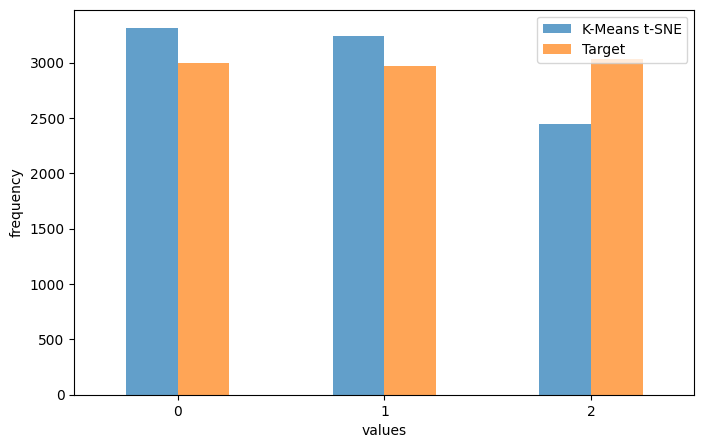

In [916]:
counts_kmeans = df_tsne_trim_kmeans['trim_kmeans_tsne'].value_counts().sort_index()
counts_target = df_tsne_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means t-SNE': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means t-SNE", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [917]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne']))

[[2667    2  330]
 [  81 2456  430]
 [ 565  782 1686]]


In [918]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2999
           1       0.76      0.83      0.79      2967
           2       0.69      0.56      0.62      3033

    accuracy                           0.76      8999
   macro avg       0.75      0.76      0.75      8999
weighted avg       0.75      0.76      0.75      8999



### trimmed k-means with umap

In [919]:
trim_kmeans_umap,trimmmed_indices = trimmed_clustering(X_umap,n_clusters=3,trim_fraction=0.1)

In [920]:
trim_kmeans_umap

KMeans(n_clusters=3, random_state=42)

In [921]:
df_umap_trim_kmeans = corr_dataset.copy()

In [922]:
df_umap_trim_kmeans = df_umap_trim_kmeans.iloc[trimmmed_indices]

In [923]:
df_umap_trim_kmeans['trim_kmeans_umap'] = trim_kmeans_umap.labels_

In [924]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,0
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,0


In [925]:
y_true = df_umap_trim_kmeans['target'].values  
y_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_trim_kmeans['trim_kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_trim_kmeans['trim_kmeans_umap'] == y_true))

accuracy before: 0.004111567951994666
accuracy after: 0.5152794754972775


In [926]:
df_umap_trim_kmeans

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,trim_kmeans_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9993,13.456150,9.566371,-13.635338,-11.543224,14.493965,-2.723066,4.429134,1.132780,-2.154537,-3.620754,...,12.768774,2.143160,-3.472100,16.700412,-12.337760,-19.998575,-10.001780,-4.855701,2,1
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


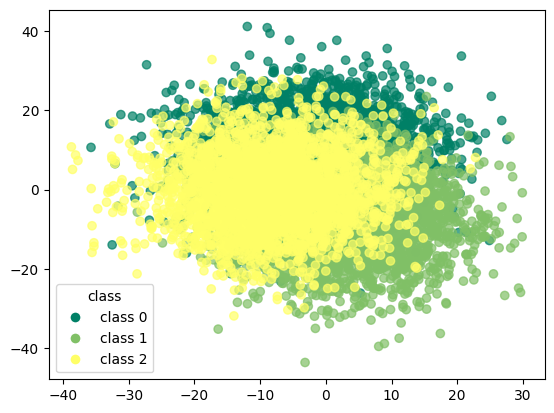

In [927]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_trim_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

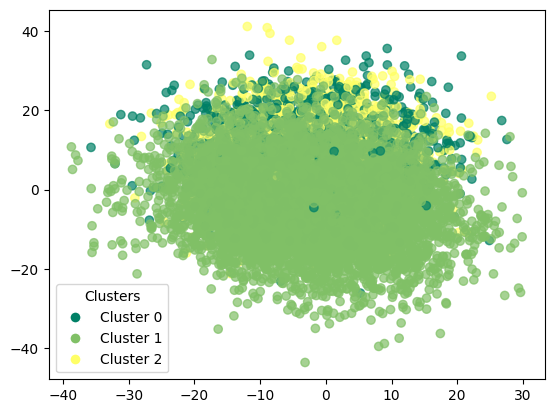

In [928]:
scatter = plt.scatter(df_umap_trim_kmeans.iloc[:, 0], df_umap_trim_kmeans.iloc[:, 1], 
                      c=df_umap_trim_kmeans['trim_kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_trim_kmeans['trim_kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

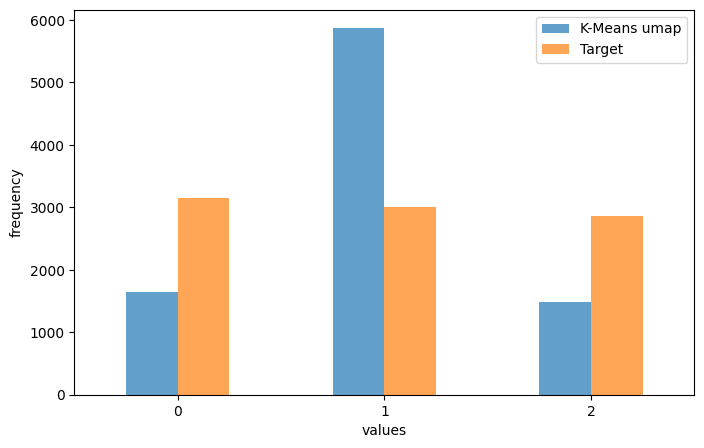

In [929]:
counts_kmeans = df_umap_trim_kmeans['trim_kmeans_umap'].value_counts().sort_index()
counts_target = df_umap_trim_kmeans['target'].value_counts().sort_index()

df_counts = pd.DataFrame({'K-Means umap': counts_kmeans, 'Target': counts_target}).fillna(0)

df_counts.plot(kind='bar', figsize=(8, 5), alpha=0.7)
plt.xlabel("values")
plt.ylabel("frequency")
plt.legend(["K-Means umap", "Target"])
plt.xticks(rotation=0)  
plt.show()

In [930]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap']))

[[1635   32 1476]
 [   1 2998    1]
 [  13 2839    4]]


In [931]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.52      0.68      3143
           1       0.51      1.00      0.68      3000
           2       0.00      0.00      0.00      2856

    accuracy                           0.52      8999
   macro avg       0.50      0.51      0.45      8999
weighted avg       0.52      0.52      0.46      8999



## dbscan

In [932]:
def plot_k_distance_graph(X, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(X)
    distances, _ = neigh.kneighbors(X)
    distances = np.sort(distances[:, k-1])
    plt.figure(figsize=(10, 6))
    plt.plot(distances)
    plt.xlabel('Points')
    plt.ylabel(f'{k}-th nearest neighbor distance')
    plt.title('K-distance Graph')
    plt.show()

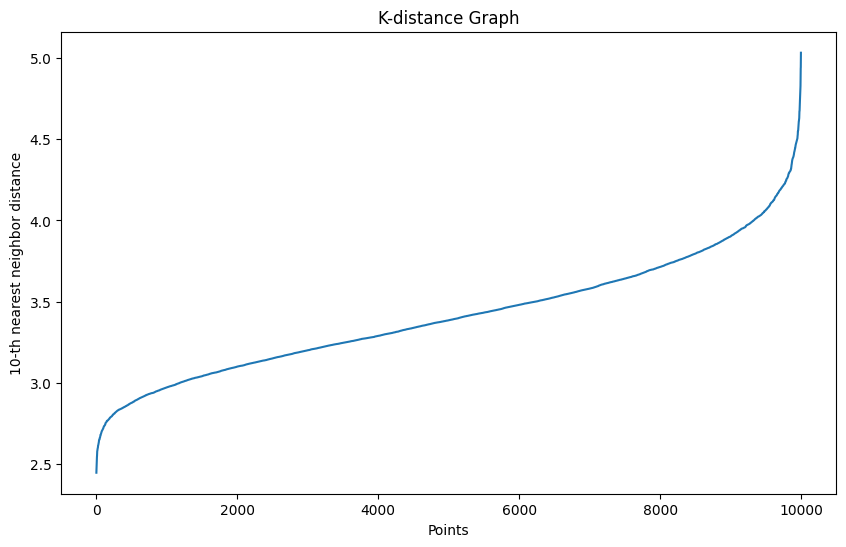

In [933]:
plot_k_distance_graph(X_values,k=10) 

In [934]:
dbscan = DBSCAN(eps=0.9,min_samples=10) # min_samples = 2*n_features

In [935]:
dbscan.fit(X_values)

DBSCAN(eps=0.9, min_samples=10)

In [936]:
df_dbscan = corr_dataset.copy()

In [937]:
df_dbscan['dbscan'] = dbscan.labels_

In [938]:
y_true = df_dbscan['target'].values  
y_kmeans = df_dbscan['dbscan'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_dbscan['dbscan'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_dbscan['dbscan'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [939]:
df_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,-1
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,-1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,-1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,-1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,-1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,-1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,-1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,-1


In [940]:
print(df_dbscan['dbscan'].value_counts())

dbscan
-1    9999
Name: count, dtype: int64


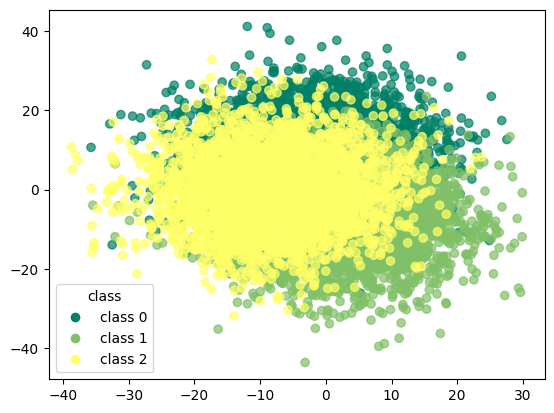

In [941]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

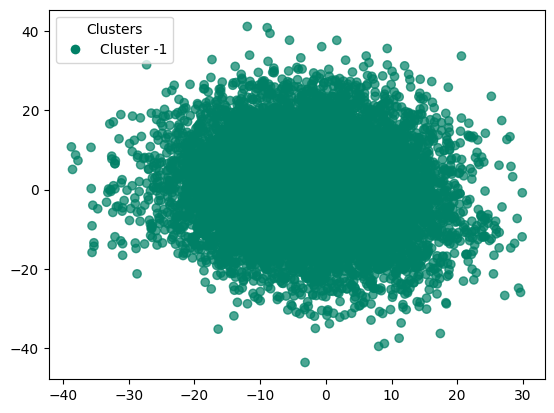

In [942]:
scatter = plt.scatter(df_dbscan.iloc[:, 0], df_dbscan.iloc[:, 1], 
                      c=df_dbscan['dbscan'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_dbscan['dbscan'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [943]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


In [944]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



### dbscan with pca

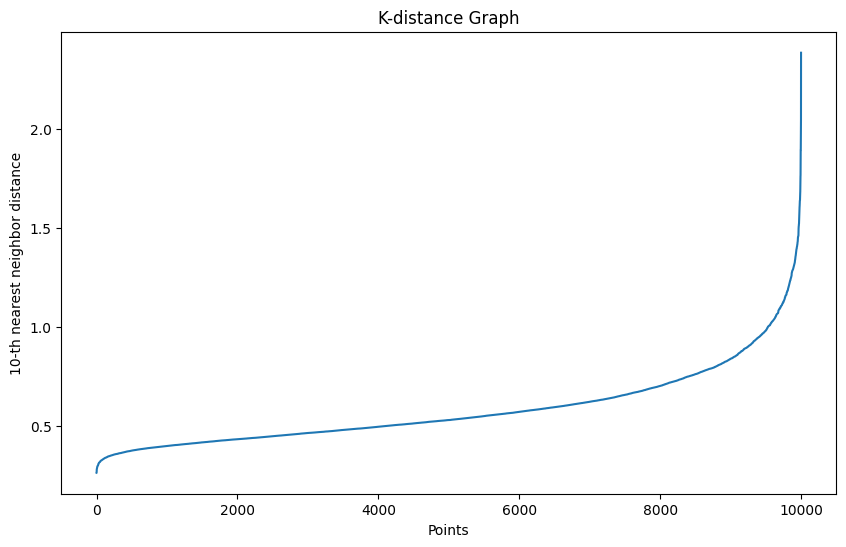

In [945]:
plot_k_distance_graph(X_pca,k=10)

In [946]:
dbscan_pca = DBSCAN(eps=0.4,min_samples=10)

In [947]:
dbscan_pca.fit(X_pca)

DBSCAN(eps=0.4, min_samples=10)

In [948]:
df_pca_dbscan = corr_dataset.copy()

In [949]:
df_pca_dbscan["dbscan_pca"] = dbscan_pca.labels_

In [950]:
y_true = df_pca_dbscan['target'].values  
y_kmeans = df_pca_dbscan['dbscan_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_dbscan['dbscan_pca'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_dbscan['dbscan_pca'] == y_true))

accuracy before: 0.09130913091309131
accuracy after: 0.06810681068106811


In [951]:
df_pca_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,3
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,-1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,-1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,-1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,-1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,-1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,-1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,-1


In [952]:
print(df_pca_dbscan['dbscan_pca'].value_counts())

dbscan_pca
-1     7224
 3      914
 10     804
 2      682
 18      35
 26      29
 14      29
 12      23
 22      19
 28      17
 23      16
 24      14
 16      11
 17      11
 11      10
 20      10
 9       10
 7        9
 5        9
 6        9
 15       8
 21       8
 31       8
 25       8
 4        8
 27       8
 8        8
 19       8
 34       7
 13       7
 32       7
 0        7
 33       6
 29       6
 1        5
 30       5
Name: count, dtype: int64


In [953]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0 ...    0    0    0]
 [2355    7    5 ...    0    0    0]
 [2405    0    0 ...    0    0    1]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


In [954]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.00      0.00      3333
           1       0.00      0.00      0.00      3333
           2       0.99      0.20      0.34      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

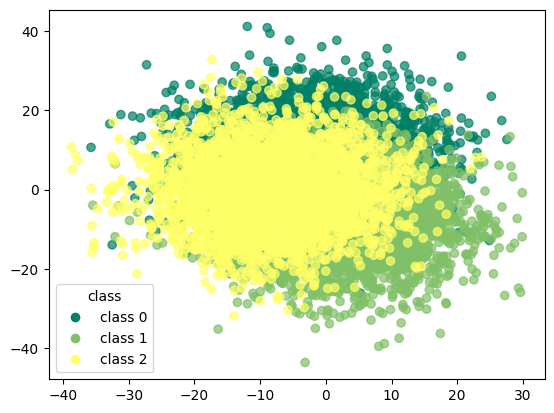

In [955]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

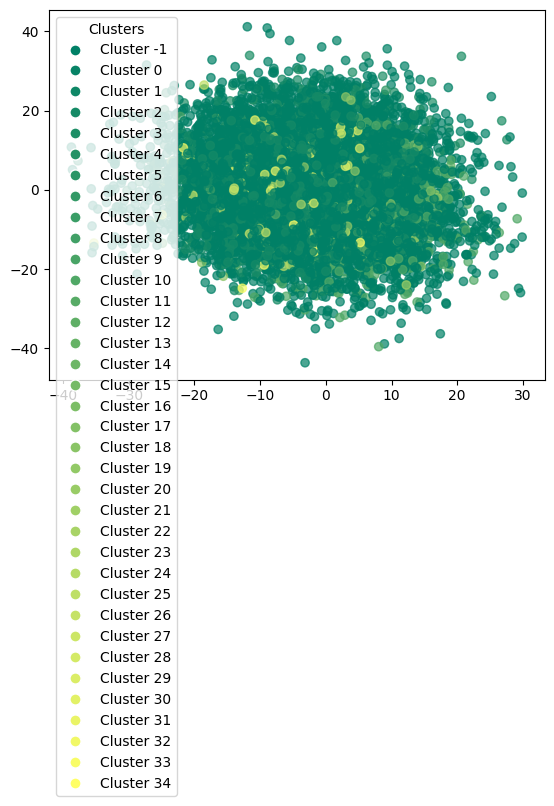

In [956]:
scatter = plt.scatter(df_pca_dbscan.iloc[:, 0], df_pca_dbscan.iloc[:, 1], 
                      c=df_pca_dbscan['dbscan_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_dbscan['dbscan_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with t-SNE

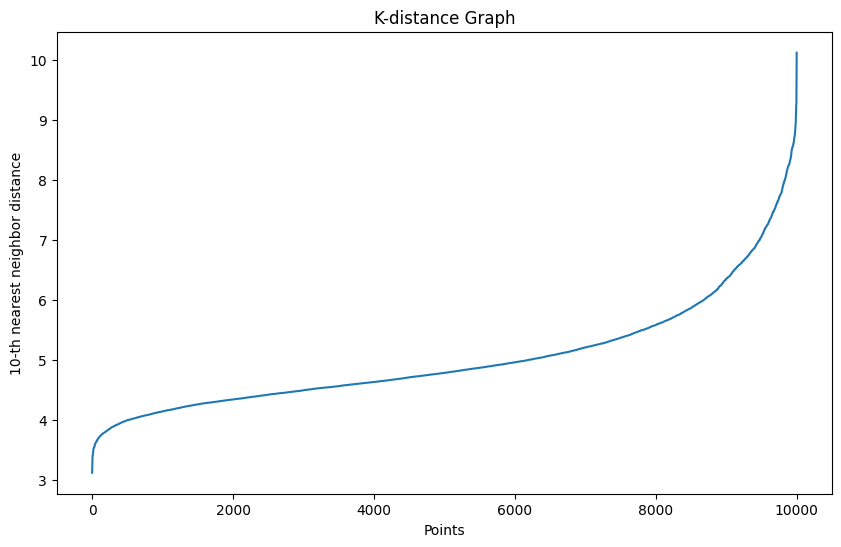

In [957]:
plot_k_distance_graph(X_tsne,k=10)

In [958]:
dbscan_tsne = DBSCAN(eps=3,min_samples=10)

In [959]:
dbscan_tsne.fit(X_tsne)

DBSCAN(eps=3, min_samples=10)

In [960]:
df_tsne_dbscan = corr_dataset.copy()

In [961]:
df_tsne_dbscan['dbscan_tsne'] = dbscan_tsne.labels_

In [962]:
y_true = df_tsne_dbscan['target'].values  
y_kmeans = df_tsne_dbscan['dbscan_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_dbscan['dbscan_tsne'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_dbscan['dbscan_tsne'] == y_true))

accuracy before: 0.0
accuracy after: 0.0


In [963]:
df_tsne_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,-1
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,-1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,-1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,-1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,-1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,-1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,-1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,-1


In [964]:
print(df_tsne_dbscan['dbscan_tsne'].value_counts())

dbscan_tsne
-1    9999
Name: count, dtype: int64


In [965]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


In [966]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



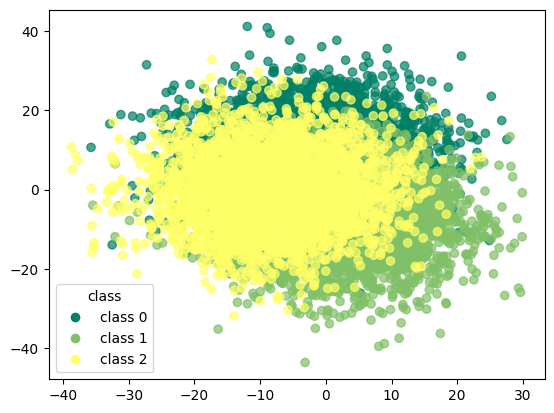

In [967]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_dbscan['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

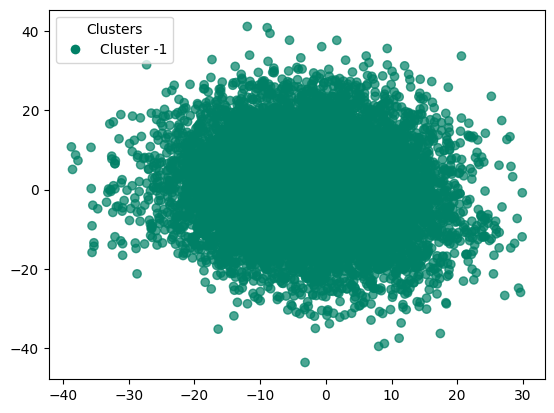

In [968]:
scatter = plt.scatter(df_tsne_dbscan.iloc[:, 0], df_tsne_dbscan.iloc[:, 1], 
                      c=df_tsne_dbscan['dbscan_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_dbscan['dbscan_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

### dbscan with umap

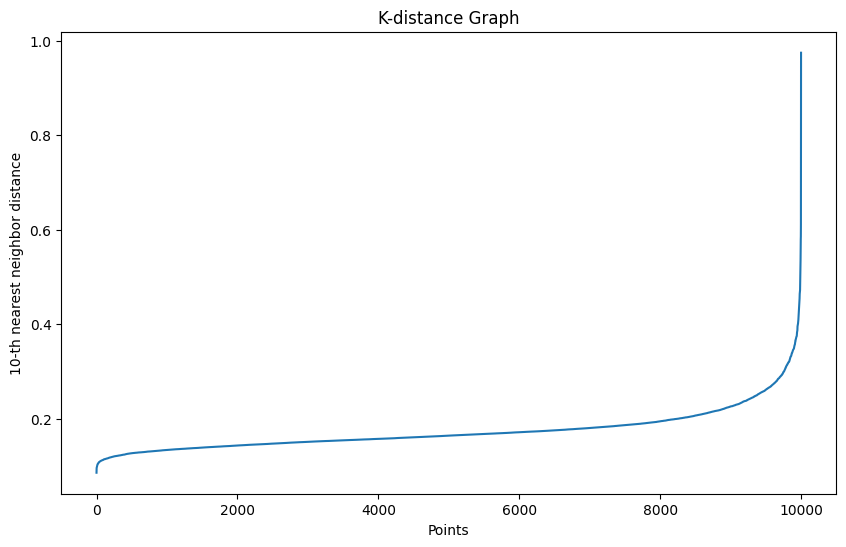

In [969]:
plot_k_distance_graph(X_umap,k=10)

In [970]:
dbscan_umap = DBSCAN(eps=0.6,min_samples=10)

In [971]:
dbscan_umap.fit(X_umap)

DBSCAN(eps=0.6, min_samples=10)

In [972]:
df_umap_dbscan = corr_dataset.copy()

In [973]:
df_umap_dbscan['dbscan_umap'] = dbscan_umap.labels_

In [974]:
y_true = df_umap_dbscan['target'].values  
y_kmeans = df_umap_dbscan['dbscan_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_dbscan['dbscan_umap'] = np.array([mapping[label] if label in mapping else -1 for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_dbscan['dbscan_umap'] == y_true))

accuracy before: 0.6559655965596559
accuracy after: 0.6559655965596559


In [975]:
df_umap_dbscan

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,dbscan_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [976]:
print(df_umap_dbscan['dbscan_umap'].value_counts())

dbscan_umap
 1    6684
 0    3314
-1       1
Name: count, dtype: int64


In [977]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0]
 [   1 3245   87    0]
 [   0   19 3314    0]
 [   0   50 3283    0]]


In [978]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.98      0.97      0.98      3333
           1       0.50      0.99      0.66      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.66      9999
   macro avg       0.37      0.49      0.41      9999
weighted avg       0.49      0.66      0.55      9999



## GMM - Gaussian Mixture Models

In [979]:
gmm = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [980]:
gmm.fit(X_values)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [981]:
df_gmm = corr_dataset.copy()

In [982]:
df_gmm['gmm'] = gmm.predict(X_values)

In [983]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [984]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.012201220122012201
accuracy after: 0.9636963696369637


In [985]:
df_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


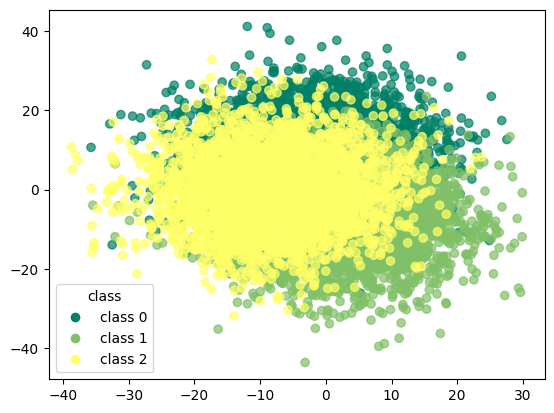

In [986]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

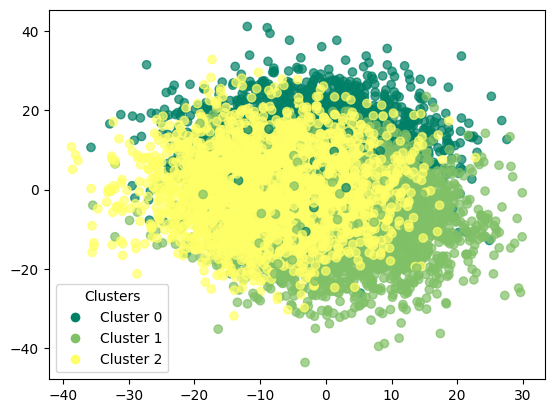

In [987]:
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [988]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3289   13   31]
 [  16 3259   58]
 [  51  194 3088]]


In [989]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      3333
           1       0.94      0.98      0.96      3333
           2       0.97      0.93      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



### GMM with pca

In [990]:
gmm_pca = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [991]:
gmm_pca.fit(X_pca)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [992]:
df_pca_gmm = corr_dataset.copy()

In [993]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [994]:
df_pca_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [995]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.014801480148014802
accuracy after: 0.9571957195719571


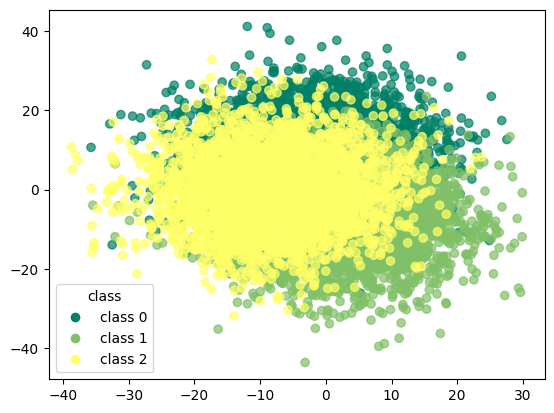

In [996]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

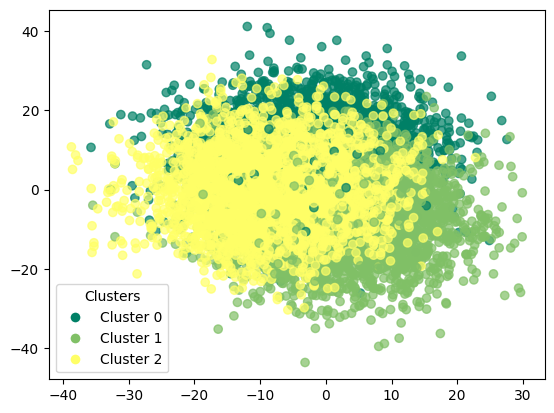

In [997]:
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [998]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[3287   19   27]
 [  17 3257   59]
 [  70  236 3027]]


In [999]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3333
           1       0.93      0.98      0.95      3333
           2       0.97      0.91      0.94      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



### GMM with t-SNE

In [1000]:
gmm_tsne = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [1001]:
gmm_tsne.fit(X_tsne)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [1002]:
df_tsne_gmm = corr_dataset.copy()

In [1003]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [1004]:
df_tsne_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,2
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,2
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,2
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1


In [1005]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.05920592059205921
accuracy after: 0.8533853385338533


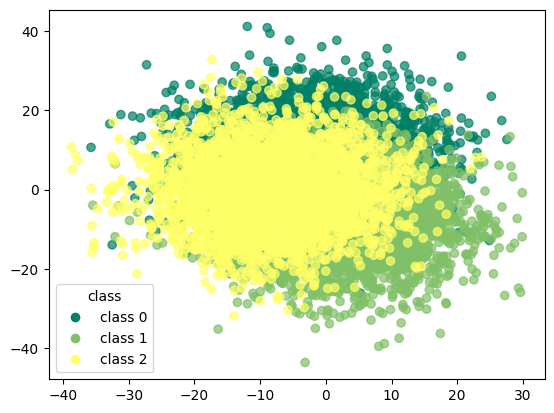

In [1006]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

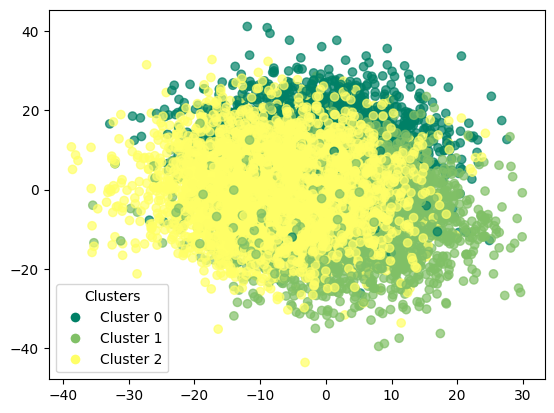

In [1007]:
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1008]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[2691    4  638]
 [  20 2747  566]
 [  22  216 3095]]


In [1009]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.81      0.89      3333
           1       0.93      0.82      0.87      3333
           2       0.72      0.93      0.81      3333

    accuracy                           0.85      9999
   macro avg       0.88      0.85      0.86      9999
weighted avg       0.88      0.85      0.86      9999



### GMM with umap

In [1010]:
gmm_umap = GaussianMixture(n_components=3,init_params='k-means++',random_state=42)

In [1011]:
gmm_umap.fit(X_umap)

GaussianMixture(init_params='k-means++', n_components=3, random_state=42)

In [1012]:
df_umap_gmm = corr_dataset.copy()

In [1013]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [1014]:
df_umap_gmm

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,gmm_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,1
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,1
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,1
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,1
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,0


In [1015]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.1111111111111111
accuracy after: 0.6684668466846685


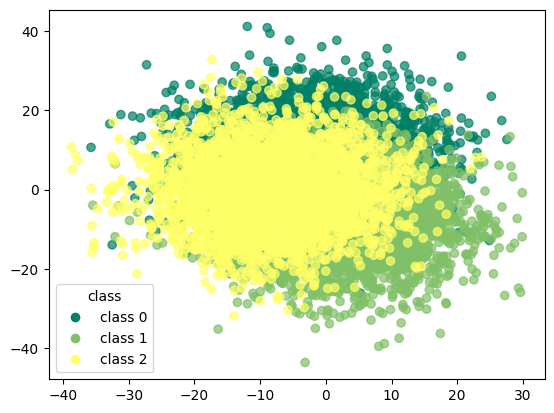

In [1016]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

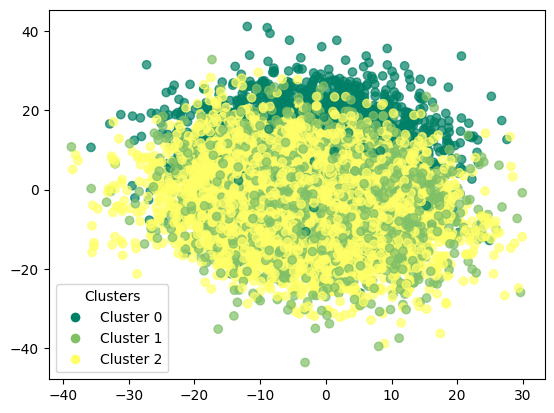

In [1017]:
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1018]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3245   37   51]
 [  19 1197 2117]
 [  50 1041 2242]]


In [1019]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.53      0.36      0.43      3333
           2       0.51      0.67      0.58      3333

    accuracy                           0.67      9999
   macro avg       0.67      0.67      0.66      9999
weighted avg       0.67      0.67      0.66      9999



## pam

In [1020]:
initial_medoids = np.random.choice(len(X_values),3,replace=False)

In [1021]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1022]:
pam = kmedoids(X_values,initial_medoids,metric=metric)

In [1023]:
pam.process()

In [1024]:
clusters = pam.get_clusters()

In [1025]:
medoids = pam.get_medoids()

In [1026]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1027]:
df_pam = corr_dataset.copy()

In [1028]:
df_pam['pam'] = labels

In [1029]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,1.0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,1.0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,1.0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,1.0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,2.0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2.0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2.0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2.0


In [1030]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.3181318131813181
accuracy after: 0.8923892389238924


In [1031]:
df_pam

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,2
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


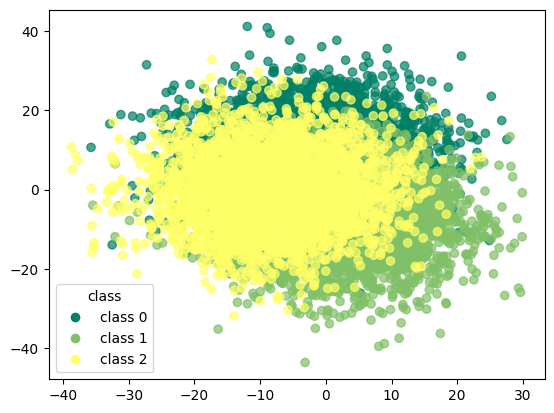

In [1032]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

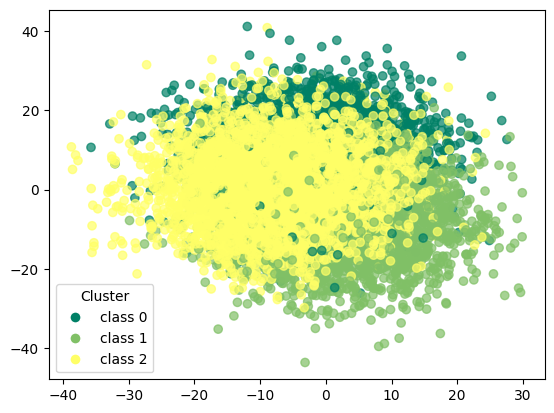

In [1033]:
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1034]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2933   37  363]
 [  27 2873  433]
 [  67  149 3117]]


In [1035]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92      3333
           1       0.94      0.86      0.90      3333
           2       0.80      0.94      0.86      3333

    accuracy                           0.89      9999
   macro avg       0.90      0.89      0.89      9999
weighted avg       0.90      0.89      0.89      9999



### pam with pca

In [1036]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [1037]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1038]:
pam_pca = kmedoids(X_pca,initial_medoids,metric=metric)

In [1039]:
pam_pca.process()

In [1040]:
clusters = pam_pca.get_clusters()

In [1041]:
medoids = pam_pca.get_medoids()

In [1042]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1043]:
df_pam_pca = corr_dataset.copy()

In [1044]:
df_pam_pca['pam_pca'] = labels

In [1045]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0.0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0.0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0.0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0.0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,2.0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1.0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,1.0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,1.0


In [1046]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.35253525352535253
accuracy after: 0.9621962196219622


In [1047]:
df_pam_pca

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_pca
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


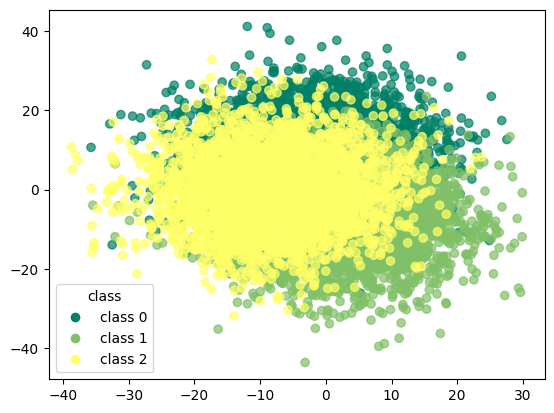

In [1048]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

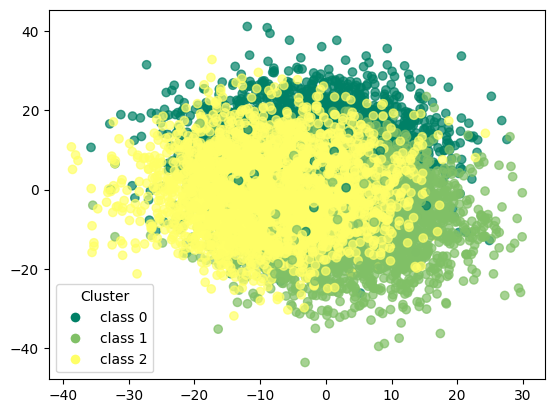

In [1049]:
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1050]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3279   13   41]
 [  17 3167  149]
 [  61   97 3175]]


In [1051]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.97      0.95      0.96      3333
           2       0.94      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



### pam with t-SNE

In [1052]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [1053]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1054]:
pam_tsne = kmedoids(X_tsne,initial_medoids,metric=metric)

In [1055]:
pam_tsne.process()

In [1056]:
clusters = pam_tsne.get_clusters()

In [1057]:
medoids = pam_tsne.get_medoids()

In [1058]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1059]:
df_pam_tsne = corr_dataset.copy()

In [1060]:
df_pam_tsne['pam_tsne'] = labels

In [1061]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0.0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0.0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0.0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2.0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1.0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1.0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0.0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2.0


In [1062]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.6381638163816382
accuracy after: 0.6381638163816382


In [1063]:
df_pam_tsne

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_tsne
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,2
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


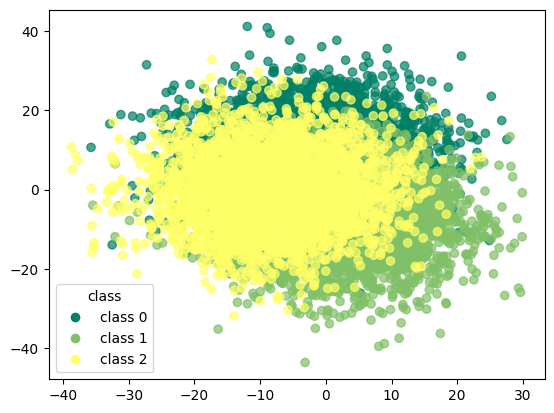

In [1064]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

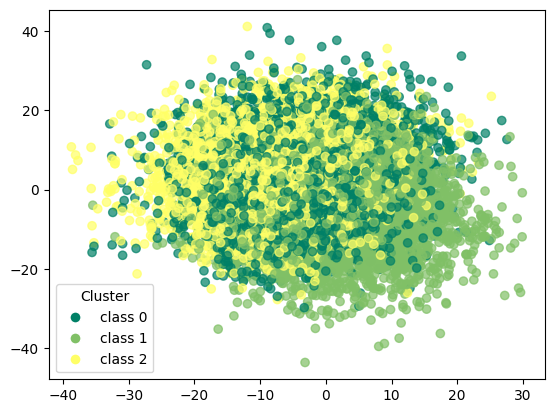

In [1065]:
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1066]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1740    7 1586]
 [  86 3180   67]
 [1166  706 1461]]


In [1067]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.58      0.52      0.55      3333
           1       0.82      0.95      0.88      3333
           2       0.47      0.44      0.45      3333

    accuracy                           0.64      9999
   macro avg       0.62      0.64      0.63      9999
weighted avg       0.62      0.64      0.63      9999



### pam with umap

In [1068]:
initial_medoids = np.random.choice(len(X_pca),3,replace=False)

In [1069]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1070]:
pam_umap = kmedoids(X_umap,initial_medoids,metric=metric)

In [1071]:
pam_umap.process()

In [1072]:
clusters = pam_umap.get_clusters()

In [1073]:
medoids = pam_umap.get_medoids()

In [1074]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1075]:
df_pam_umap = corr_dataset.copy()

In [1076]:
df_pam_umap['pam_umap'] = labels

In [1077]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,1.0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,1.0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,1.0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,1.0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,2.0
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,2.0
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,0.0
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,0.0


In [1078]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.024902490249024904
accuracy after: 0.954995499549955


In [1079]:
df_pam_umap

,vab_1,vab_2,vab_3,vab_4,vab_5,vab_6,vab_7,vab_8,vab_9,vab_10,...,vab_13,vab_14,vab_15,vab_16,vab_17,vab_18,vab_19,vab_20,target,pam_umap
0,-7.817909,8.956167,17.108992,7.709350,4.756394,-5.593953,-9.372784,-1.525700,-0.891454,7.585449,...,-0.116465,1.950551,-12.506951,-17.876450,-0.352860,0.689676,6.236669,-14.740103,0,0
1,9.843743,6.793791,-8.003942,-11.480173,-10.657464,-21.834518,-4.018628,8.877354,0.956580,-4.145523,...,7.429264,-4.541291,-9.973727,-18.861442,1.015375,-2.700631,-0.456859,-0.936594,0,0
2,-2.131067,5.769869,10.308300,6.635646,-5.759687,-8.416145,-2.366681,0.935726,6.093702,7.651740,...,2.034956,4.393676,2.043206,-17.033339,-0.412124,3.173137,8.354614,5.969210,0,0
3,-1.391770,1.125246,1.198167,6.665135,-6.260243,-1.528269,1.545263,10.592811,-0.090992,-1.022024,...,7.632919,-13.383230,1.400216,-12.217237,-3.140693,-3.471967,15.249618,8.873524,0,0
4,4.256418,8.834575,10.448795,1.831163,2.006861,-0.822676,-2.715164,11.102270,5.462456,11.657028,...,-5.296052,-6.390449,-11.334767,-6.615516,-5.490082,-0.438247,2.987302,-4.298098,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9994,1.783821,-7.565830,-4.571191,9.858746,6.786078,17.252993,-7.897135,-5.628495,25.929841,-21.327553,...,5.112271,9.556933,1.696273,13.807049,18.689925,-9.367227,-3.060391,-6.303975,2,1
9995,-9.814316,-6.041084,-10.444226,7.780328,-5.167972,3.689547,13.923204,-10.561519,-6.396215,-11.587113,...,-3.529468,22.005106,7.435574,-6.355351,8.576000,-18.863367,-6.033282,1.937435,2,1
9996,-28.889249,-14.854963,-5.783658,-11.080022,-2.713625,0.317970,-4.868844,-1.465495,2.076676,-4.097038,...,7.816444,13.527571,-9.549657,-5.918138,2.409895,8.006890,-20.452040,-2.750239,2,2
9997,-6.625324,6.914373,-1.402097,2.011395,-2.030424,3.886289,-6.504333,-12.336985,12.301562,-13.582151,...,18.320732,24.830442,-6.240328,-3.595105,-21.137999,-8.516038,-26.202404,3.546601,2,2


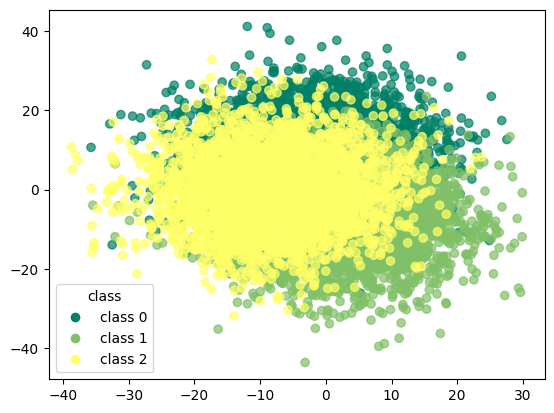

In [1080]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

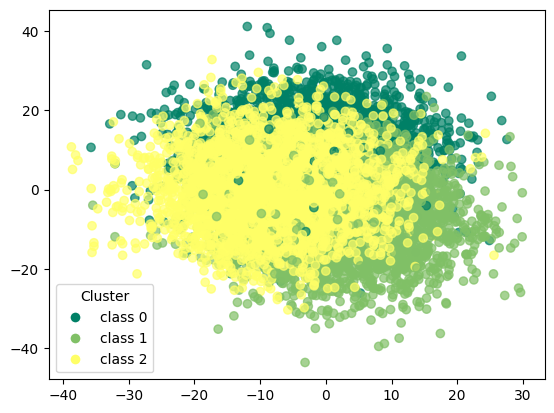

In [1081]:
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1082]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3245   19   69]
 [  19 3182  132]
 [  50  161 3122]]


In [1083]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.95      0.95      0.95      3333
           2       0.94      0.94      0.94      3333

    accuracy                           0.95      9999
   macro avg       0.96      0.95      0.96      9999
weighted avg       0.96      0.95      0.96      9999



# overall results k-means

## basic

In [1084]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.96      0.96      0.96      3333
           2       0.95      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



In [1085]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[3281   12   40]
 [  19 3193  121]
 [  57  111 3165]]


## + pca

In [1086]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.96      0.96      0.96      3333
           2       0.95      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



In [1087]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[3280   13   40]
 [  20 3193  120]
 [  57  115 3161]]


## + t-SNE

In [1088]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.79      0.87      0.83      3333
           1       0.77      0.84      0.81      3333
           2       0.66      0.53      0.59      3333

    accuracy                           0.75      9999
   macro avg       0.74      0.75      0.74      9999
weighted avg       0.74      0.75      0.74      9999



In [1089]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[2916    5  412]
 [  25 2807  501]
 [ 731  821 1781]]


## + UMAP

In [1090]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.95      0.95      0.95      3333
           2       0.94      0.94      0.94      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



In [1091]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[3245   19   69]
 [  19 3181  133]
 [  50  159 3124]]


# overall results trimmed k-means

## basic

In [1092]:
print(classification_report(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2999
           1       0.96      0.96      0.96      2967
           2       0.95      0.95      0.95      3033

    accuracy                           0.97      8999
   macro avg       0.97      0.97      0.97      8999
weighted avg       0.97      0.97      0.97      8999



In [1093]:
print(confusion_matrix(df_trim_kmeans['target'],df_trim_kmeans['trim_kmeans']))

[[2958    8   33]
 [  16 2844  107]
 [  45   97 2891]]


## + pca

In [1094]:
print(classification_report(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

              precision    recall  f1-score   support

           0       0.97      0.98      0.98      2999
           1       0.95      0.95      0.95      2967
           2       0.95      0.94      0.95      3033

    accuracy                           0.96      8999
   macro avg       0.96      0.96      0.96      8999
weighted avg       0.96      0.96      0.96      8999



In [1095]:
print(confusion_matrix(df_pca_trim_kmeans['target'],df_pca_trim_kmeans['trim_kmeans_pca']))

[[2951   12   36]
 [  34 2829  104]
 [  42  129 2862]]


## + t-SNE

In [1096]:
print(classification_report(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       0.81      0.89      0.85      2999
           1       0.76      0.83      0.79      2967
           2       0.69      0.56      0.62      3033

    accuracy                           0.76      8999
   macro avg       0.75      0.76      0.75      8999
weighted avg       0.75      0.76      0.75      8999



In [1097]:
print(confusion_matrix(df_tsne_trim_kmeans['target'],df_tsne_trim_kmeans['trim_kmeans_tsne'])) 

[[2667    2  330]
 [  81 2456  430]
 [ 565  782 1686]]


## + UMAP

In [1098]:
print(classification_report(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

              precision    recall  f1-score   support

           0       0.99      0.52      0.68      3143
           1       0.51      1.00      0.68      3000
           2       0.00      0.00      0.00      2856

    accuracy                           0.52      8999
   macro avg       0.50      0.51      0.45      8999
weighted avg       0.52      0.52      0.46      8999



In [1099]:
print(confusion_matrix(df_umap_trim_kmeans['target'],df_umap_trim_kmeans['trim_kmeans_umap'])) 

[[1635   32 1476]
 [   1 2998    1]
 [  13 2839    4]]


# overall results dbscan

## basic

In [1100]:
print(classification_report(df_dbscan['target'],df_dbscan['dbscan']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



In [1101]:
print(confusion_matrix(df_dbscan['target'],df_dbscan['dbscan']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


## + pca

In [1102]:
print(classification_report(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       1.00      0.00      0.00      3333
           1       0.00      0.00      0.00      3333
           2       0.99      0.20      0.34      3333
           3       0.00      0.00      0.00         0
           4       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0
           7       0.00      0.00      0.00         0
           8       0.00      0.00      0.00         0
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.00      0.00      0.00         0
          12       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         0
          14       0.00      0.00      0.00         0
          15       0.00      0.00      0.00         0
          16       0.00    

In [1103]:
print(confusion_matrix(df_pca_dbscan['target'],df_pca_dbscan['dbscan_pca']))

[[   0    0    0 ...    0    0    0]
 [2355    7    5 ...    0    0    0]
 [2405    0    0 ...    0    0    1]
 ...
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]
 [   0    0    0 ...    0    0    0]]


## + t-SNE

In [1104]:
print(classification_report(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       0.0
           0       0.00      0.00      0.00    3333.0
           1       0.00      0.00      0.00    3333.0
           2       0.00      0.00      0.00    3333.0

    accuracy                           0.00    9999.0
   macro avg       0.00      0.00      0.00    9999.0
weighted avg       0.00      0.00      0.00    9999.0



In [1105]:
print(confusion_matrix(df_tsne_dbscan['target'],df_tsne_dbscan['dbscan_tsne']))

[[   0    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]
 [3333    0    0    0]]


## + UMAP

In [1106]:
print(classification_report(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.98      0.97      0.98      3333
           1       0.50      0.99      0.66      3333
           2       0.00      0.00      0.00      3333

    accuracy                           0.66      9999
   macro avg       0.37      0.49      0.41      9999
weighted avg       0.49      0.66      0.55      9999



In [1107]:
print(confusion_matrix(df_umap_dbscan['target'],df_umap_dbscan['dbscan_umap']))

[[   0    0    0    0]
 [   1 3245   87    0]
 [   0   19 3314    0]
 [   0   50 3283    0]]


# overall results GMM

## basic

In [1108]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      3333
           1       0.94      0.98      0.96      3333
           2       0.97      0.93      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



In [1109]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[3289   13   31]
 [  16 3259   58]
 [  51  194 3088]]


## + pca

In [1110]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      3333
           1       0.93      0.98      0.95      3333
           2       0.97      0.91      0.94      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



In [1111]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[3287   19   27]
 [  17 3257   59]
 [  70  236 3027]]


## + t-SNE

In [1112]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       0.98      0.81      0.89      3333
           1       0.93      0.82      0.87      3333
           2       0.72      0.93      0.81      3333

    accuracy                           0.85      9999
   macro avg       0.88      0.85      0.86      9999
weighted avg       0.88      0.85      0.86      9999



In [1113]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[2691    4  638]
 [  20 2747  566]
 [  22  216 3095]]


## + UMAP

In [1114]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.53      0.36      0.43      3333
           2       0.51      0.67      0.58      3333

    accuracy                           0.67      9999
   macro avg       0.67      0.67      0.66      9999
weighted avg       0.67      0.67      0.66      9999



In [1115]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[3245   37   51]
 [  19 1197 2117]
 [  50 1041 2242]]


# overall results pam

## basic

In [1116]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[2933   37  363]
 [  27 2873  433]
 [  67  149 3117]]


In [1117]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92      3333
           1       0.94      0.86      0.90      3333
           2       0.80      0.94      0.86      3333

    accuracy                           0.89      9999
   macro avg       0.90      0.89      0.89      9999
weighted avg       0.90      0.89      0.89      9999



## + pca

In [1118]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[3279   13   41]
 [  17 3167  149]
 [  61   97 3175]]


In [1119]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3333
           1       0.97      0.95      0.96      3333
           2       0.94      0.95      0.95      3333

    accuracy                           0.96      9999
   macro avg       0.96      0.96      0.96      9999
weighted avg       0.96      0.96      0.96      9999



## + t-SNE

In [1120]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[1740    7 1586]
 [  86 3180   67]
 [1166  706 1461]]


In [1121]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       0.58      0.52      0.55      3333
           1       0.82      0.95      0.88      3333
           2       0.47      0.44      0.45      3333

    accuracy                           0.64      9999
   macro avg       0.62      0.64      0.63      9999
weighted avg       0.62      0.64      0.63      9999



## + umap

In [1122]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[3245   19   69]
 [  19 3182  132]
 [  50  161 3122]]


In [1123]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       0.98      0.97      0.98      3333
           1       0.95      0.95      0.95      3333
           2       0.94      0.94      0.94      3333

    accuracy                           0.95      9999
   macro avg       0.96      0.95      0.96      9999
weighted avg       0.96      0.95      0.96      9999

